# Project Setup and Environment Check

In this phase, we check whether the notebook is running correctly inside the local VS Code environment.

We will:
- import the required Python libraries
- check the current working directory
- detect whether GPU is available
- define the base project paths

This step is important because local deep learning projects often fail because of wrong paths, missing packages, or incorrect working directories.

In [63]:
import os
from pathlib import Path

import pandas as pd
import numpy as np

import torch

print("Current working directory:")
print(os.getcwd())

print("\nPyTorch version:")
print(torch.__version__)

print("\nCUDA available:")
print(torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU device:")
    print(torch.cuda.get_device_name(0))
else:
    print("Running on CPU")

Current working directory:
d:\Deep Learning\Dataset\face_dataset

PyTorch version:
2.5.1+cu121

CUDA available:
True
GPU device:
NVIDIA GeForce RTX 3070 Ti Laptop GPU


# Define Project Paths

Here we define all important project paths.

We are keeping the project local and organized. The dataset should be stored inside the `data` folder.

Expected structure:

- `data/train/` contains training images
- `data/test/` contains testing images
- `data/train.csv` contains training labels
- `data/test.csv` contains testing labels

Using `Path` helps avoid path errors across Windows, Mac, and Linux.

In [64]:
from pathlib import Path

# If the notebook is inside the notebooks folder, parent.parent takes us to the project root
PROJECT_ROOT = Path.cwd()

DATA_DIR = PROJECT_ROOT

TRAIN_IMAGE_DIR = DATA_DIR / "train"
TEST_IMAGE_DIR = DATA_DIR / "test"

TRAIN_CSV_PATH = DATA_DIR / "train.csv"
TEST_CSV_PATH = DATA_DIR / "test.csv"

MODEL_DIR = PROJECT_ROOT / "model"
OUTPUT_DIR = PROJECT_ROOT / "outputs"
PLOTS_DIR = OUTPUT_DIR / "plots"
REPORTS_DIR = OUTPUT_DIR / "reports"

MODEL_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)
PLOTS_DIR.mkdir(exist_ok=True)
REPORTS_DIR.mkdir(exist_ok=True)

print("Project root:", PROJECT_ROOT)
print("Train image directory:", TRAIN_IMAGE_DIR)
print("Test image directory:", TEST_IMAGE_DIR)
print("Train CSV:", TRAIN_CSV_PATH)
print("Test CSV:", TEST_CSV_PATH)

Project root: d:\Deep Learning\Dataset\face_dataset
Train image directory: d:\Deep Learning\Dataset\face_dataset\train
Test image directory: d:\Deep Learning\Dataset\face_dataset\test
Train CSV: d:\Deep Learning\Dataset\face_dataset\train.csv
Test CSV: d:\Deep Learning\Dataset\face_dataset\test.csv


# File and Folder Validation

Before loading the dataset, we verify that all required folders and files exist.

This prevents hidden errors later during training.

If any path returns `False`, the dataset is not placed correctly and must be fixed before continuing.

In [65]:
required_paths = {
    "Data directory": DATA_DIR,
    "Train image directory": TRAIN_IMAGE_DIR,
    "Test image directory": TEST_IMAGE_DIR,
    "Train CSV file": TRAIN_CSV_PATH,
    "Test CSV file": TEST_CSV_PATH,
}

for name, path in required_paths.items():
    print(f"{name}: {path.exists()} -> {path}")

Data directory: True -> d:\Deep Learning\Dataset\face_dataset
Train image directory: True -> d:\Deep Learning\Dataset\face_dataset\train
Test image directory: True -> d:\Deep Learning\Dataset\face_dataset\test
Train CSV file: True -> d:\Deep Learning\Dataset\face_dataset\train.csv
Test CSV file: True -> d:\Deep Learning\Dataset\face_dataset\test.csv


# Load Train and Test CSV Files

Now we load the training and testing CSV files using Pandas.

The goal is to inspect:
- number of rows
- column names
- sample records
- whether the dataset contains image filenames, age labels, and gender labels

For our final model, we need three important pieces of information:

1. image filename
2. gender label
3. age or age group label

In [66]:
train_df = pd.read_csv(TRAIN_CSV_PATH)
test_df = pd.read_csv(TEST_CSV_PATH)

print("Train CSV shape:", train_df.shape)
print("Test CSV shape:", test_df.shape)

print("\nTrain CSV columns:")
print(train_df.columns.tolist())

print("\nTest CSV columns:")
print(test_df.columns.tolist())

print("\nTraining data sample:")
display(train_df.head())

print("\nTesting data sample:")
display(test_df.head())

Train CSV shape: (34708, 4)
Test CSV shape: (8677, 2)

Train CSV columns:
['id', 'full_path', 'gender', 'age']

Test CSV columns:
['id', 'full_path']

Training data sample:


,id,full_path,gender,age
0,0,train/00000.jpg,1,66
1,1,train/00001.jpg,1,53
2,2,train/00002.jpg,1,20
3,3,train/00003.jpg,1,32
4,4,train/00004.jpg,1,21



Testing data sample:


,id,full_path
0,0,test/00000.jpg
1,1,test/00001.jpg
2,2,test/00002.jpg
3,3,test/00003.jpg
4,4,test/00004.jpg


# Basic CSV Quality Check

In this phase, we check whether the CSV files have missing values, duplicate rows, or inconsistent columns.

This is basic dataset validation.

If missing values exist in important columns such as image filename, age, or gender, we must handle them before training.

In [67]:
print("Missing values in train CSV:")
display(train_df.isnull().sum())

print("\nMissing values in test CSV:")
display(test_df.isnull().sum())

print("\nDuplicate rows in train CSV:", train_df.duplicated().sum())
print("Duplicate rows in test CSV:", test_df.duplicated().sum())

Missing values in train CSV:


id           0
full_path    0
gender       0
age          0
dtype: int64


Missing values in test CSV:


id           0
full_path    0
dtype: int64


Duplicate rows in train CSV: 0
Duplicate rows in test CSV: 0


# Identify Important Columns

Now we define which CSV columns represent:

- image filename
- age
- gender

In [68]:
print("Available train columns:")
for col in train_df.columns:
    print("-", col)

Available train columns:
- id
- full_path
- gender
- age


# Split Labeled Training Data Into Train and Validation Sets

The test CSV does not contain age and gender labels, so it cannot be used for model evaluation.

Instead, we split the labeled `train.csv` into:

- training data
- validation data

The model will train on the training split and be evaluated on the validation split.

The unlabeled `test.csv` will only be used later for prediction and demo inference.

In [69]:
print("Available train columns:")
for col in train_df.columns:
    print("-", col)

print("\nAvailable test columns:")
for col in test_df.columns:
    print("-", col)

Available train columns:
- id
- full_path
- gender
- age

Available test columns:
- id
- full_path


In [70]:
# Change these based on your actual train CSV column names

IMAGE_COL = "full_path"
AGE_COL = "age"
GENDER_COL = "gender"

train_required_columns = [IMAGE_COL, AGE_COL, GENDER_COL]
test_required_columns = [IMAGE_COL]

print("Checking train CSV columns:")
for col in train_required_columns:
    if col not in train_df.columns:
        print(f"Missing column in train CSV: {col}")
    else:
        print(f"Found column in train CSV: {col}")

print("\nChecking test CSV columns:")
for col in test_required_columns:
    if col not in test_df.columns:
        print(f"Missing column in test CSV: {col}")
    else:
        print(f"Found column in test CSV: {col}")

Checking train CSV columns:
Found column in train CSV: full_path
Found column in train CSV: age
Found column in train CSV: gender

Checking test CSV columns:
Found column in test CSV: full_path


In [71]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    train_df,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

print("Training rows:", len(train_df))
print("Validation rows:", len(val_df))
print("Unlabeled test rows:", len(test_df))

Training rows: 27766
Validation rows: 6942
Unlabeled test rows: 8677


# Inspect Gender Labels

Now we inspect the gender labels from the labeled data.

Since the test CSV does not contain labels, we only check:

- training split
- validation split

This helps us understand the gender class distribution before training.

In [72]:
print("Unique gender labels in train:")
print(train_df[GENDER_COL].unique())

print("\nGender distribution in train:")
display(train_df[GENDER_COL].value_counts())

print("\nUnique gender labels in validation:")
print(val_df[GENDER_COL].unique())

print("\nGender distribution in validation:")
display(val_df[GENDER_COL].value_counts())

Unique gender labels in train:
[1 0]

Gender distribution in train:


gender
1    20860
0     6906
Name: count, dtype: int64


Unique gender labels in validation:
[1 0]

Gender distribution in validation:


gender
1    5224
0    1718
Name: count, dtype: int64

# Clean Gender Labels

We convert gender labels into numerical format.

The model cannot directly learn from text labels, so we map:

- Female → 0
- Male → 1

We apply this only to the labeled train and validation data.

In [73]:
def clean_gender_label(value):
    value = str(value).strip().lower()
    
    if value in ["male", "m", "1"]:
        return 1
    
    if value in ["female", "f", "0"]:
        return 0
    
    return None


train_df["gender_label"] = train_df[GENDER_COL].apply(clean_gender_label)
val_df["gender_label"] = val_df[GENDER_COL].apply(clean_gender_label)

print("Train gender label distribution:")
display(train_df["gender_label"].value_counts(dropna=False))

print("\nValidation gender label distribution:")
display(val_df["gender_label"].value_counts(dropna=False))

Train gender label distribution:


gender_label
1    20860
0     6906
Name: count, dtype: int64


Validation gender label distribution:


gender_label
1    5224
0    1718
Name: count, dtype: int64

# Convert Age Into Age Groups

Exact age prediction is harder and more error-prone.

Instead of predicting exact age, we convert age into four age groups:

- Child: 0–12
- Young Adult: 13–30
- Adult: 31–55
- Senior: 56+

This turns the problem into a cleaner classification task.

In [74]:
def age_to_group(age):
    try:
        age = int(age)
    except:
        return None
    
    if age <= 12:
        return 0   # Child
    elif age <= 30:
        return 1   # Young Adult
    elif age <= 55:
        return 2   # Adult
    else:
        return 3   # Senior


age_group_names = {
    0: "Child",
    1: "Young Adult",
    2: "Adult",
    3: "Senior"
}

train_df["age_group_label"] = train_df[AGE_COL].apply(age_to_group)
val_df["age_group_label"] = val_df[AGE_COL].apply(age_to_group)

print("Train age group distribution:")
display(train_df["age_group_label"].map(age_group_names).value_counts(dropna=False))

print("\nValidation age group distribution:")
display(val_df["age_group_label"].map(age_group_names).value_counts(dropna=False))

Train age group distribution:


age_group_label
Young Adult    12646
Adult          10608
Senior          4413
Child             99
Name: count, dtype: int64


Validation age group distribution:


age_group_label
Young Adult    3149
Adult          2645
Senior         1121
Child            27
Name: count, dtype: int64

# Remove Invalid Rows

Now we remove rows where important values are missing or invalid.

For train and validation data, we need:

- image filename
- gender label
- age group label

For the unlabeled test data, we only need:

- image filename

The test data has no labels, so we do not clean it using gender or age columns.

In [75]:
print("Before cleaning:")
print("Train rows:", len(train_df))
print("Validation rows:", len(val_df))
print("Unlabeled test rows:", len(test_df))

train_df = train_df.dropna(subset=[IMAGE_COL, "gender_label", "age_group_label"]).copy()
val_df = val_df.dropna(subset=[IMAGE_COL, "gender_label", "age_group_label"]).copy()

test_df = test_df.dropna(subset=[IMAGE_COL]).copy()

train_df["gender_label"] = train_df["gender_label"].astype(int)
val_df["gender_label"] = val_df["gender_label"].astype(int)

train_df["age_group_label"] = train_df["age_group_label"].astype(int)
val_df["age_group_label"] = val_df["age_group_label"].astype(int)

print("\nAfter cleaning:")
print("Train rows:", len(train_df))
print("Validation rows:", len(val_df))
print("Unlabeled test rows:", len(test_df))

Before cleaning:
Train rows: 27766
Validation rows: 6942
Unlabeled test rows: 8677

After cleaning:
Train rows: 27766
Validation rows: 6942
Unlabeled test rows: 8677


# Check Image Files Exist

Now we check whether image files mentioned in the CSV files actually exist.

We check:

- train_df images inside `data/train/`
- val_df images inside `data/train/`
- test_df images inside `data/test/`

The validation set comes from the original training CSV, so its images are still inside the training image folder.

In [76]:
from pathlib import Path

def resolve_image_path_from_data_dir(filename):
    filename = str(filename).strip()
    image_path = DATA_DIR / filename
    
    if image_path.exists():
        return image_path
    
    return None


train_df["resolved_image_path"] = train_df[IMAGE_COL].apply(resolve_image_path_from_data_dir)
val_df["resolved_image_path"] = val_df[IMAGE_COL].apply(resolve_image_path_from_data_dir)
test_df["resolved_image_path"] = test_df[IMAGE_COL].apply(resolve_image_path_from_data_dir)

print("Train matched images:", train_df["resolved_image_path"].notna().sum(), "/", len(train_df))
print("Validation matched images:", val_df["resolved_image_path"].notna().sum(), "/", len(val_df))
print("Unlabeled test matched images:", test_df["resolved_image_path"].notna().sum(), "/", len(test_df))

print("\nSample resolved train paths:")
display(train_df[[IMAGE_COL, "resolved_image_path"]].head(10))

Train matched images: 27766 / 27766
Validation matched images: 6942 / 6942
Unlabeled test matched images: 8677 / 8677

Sample resolved train paths:


,full_path,resolved_image_path
0,train/05621.jpg,d:\Deep Learning\Dataset\face_dataset\train\05...
1,train/12895.jpg,d:\Deep Learning\Dataset\face_dataset\train\12...
2,train/20516.jpg,d:\Deep Learning\Dataset\face_dataset\train\20...
3,train/16584.jpg,d:\Deep Learning\Dataset\face_dataset\train\16...
4,train/12912.jpg,d:\Deep Learning\Dataset\face_dataset\train\12...
5,train/25941.jpg,d:\Deep Learning\Dataset\face_dataset\train\25...
6,train/13438.jpg,d:\Deep Learning\Dataset\face_dataset\train\13...
7,train/04977.jpg,d:\Deep Learning\Dataset\face_dataset\train\04...
8,train/17698.jpg,d:\Deep Learning\Dataset\face_dataset\train\17...
9,train/02676.jpg,d:\Deep Learning\Dataset\face_dataset\train\02...


# Keep Only Rows With Existing Images

If some image files are missing, we remove those rows.

This prevents image-loading errors later during PyTorch training and prediction.

The validation images are still stored in the training image folder because the validation set was split from the original training data.

In [77]:
print("Before keeping matched images:")
print("Train rows:", len(train_df))
print("Validation rows:", len(val_df))
print("Unlabeled test rows:", len(test_df))

train_df = train_df.dropna(subset=["resolved_image_path"]).reset_index(drop=True)
val_df = val_df.dropna(subset=["resolved_image_path"]).reset_index(drop=True)
test_df = test_df.dropna(subset=["resolved_image_path"]).reset_index(drop=True)

print("\nAfter keeping matched images:")
print("Train rows:", len(train_df))
print("Validation rows:", len(val_df))
print("Unlabeled test rows:", len(test_df))

Before keeping matched images:
Train rows: 27766
Validation rows: 6942
Unlabeled test rows: 8677

After keeping matched images:
Train rows: 27766
Validation rows: 6942
Unlabeled test rows: 8677


# Visualize Cleaned Training Images

Now we display a few cleaned training images with their labels.

This confirms that:
- image paths are resolved correctly
- images can be opened
- gender labels are correctly mapped
- age groups are correctly created

This is a final visual sanity check before building the PyTorch dataset.

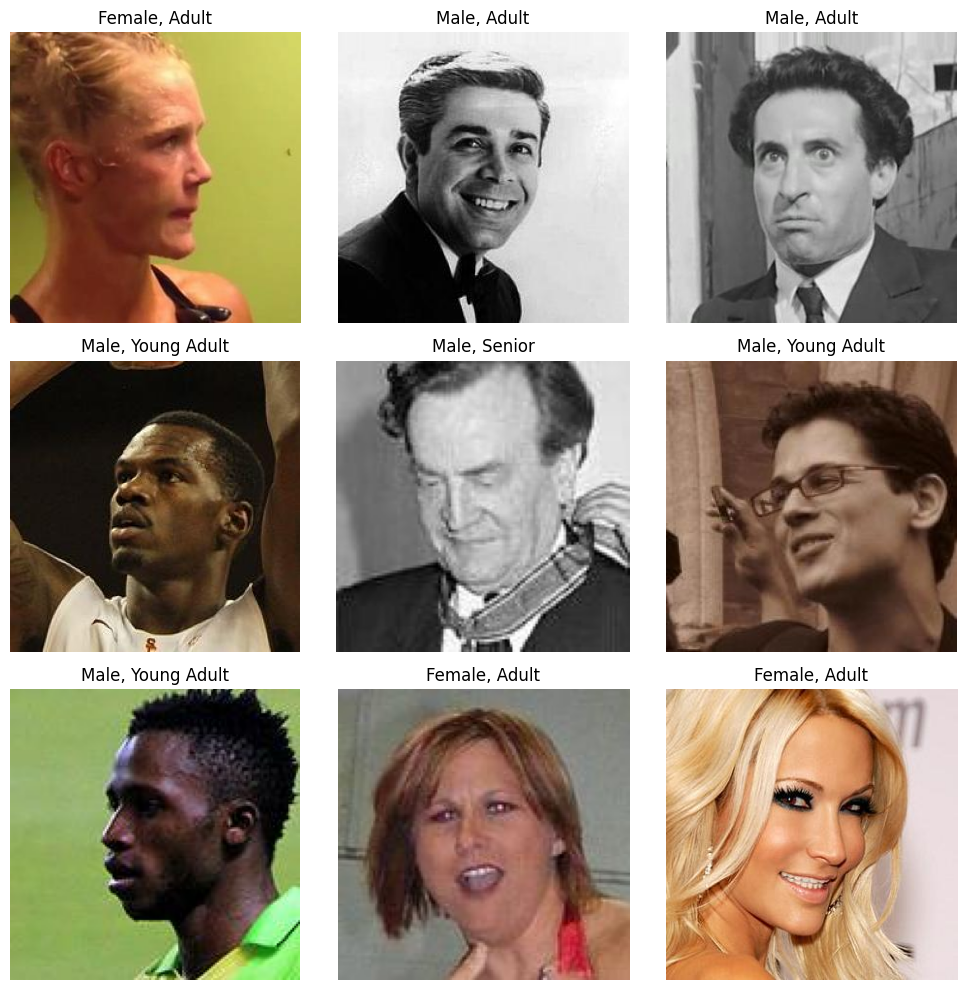

In [78]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

gender_names = {
    0: "Female",
    1: "Male"
}

age_group_names = {
    0: "Child",
    1: "Young Adult",
    2: "Adult",
    3: "Senior"
}

sample_df = train_df.sample(min(9, len(train_df)), random_state=42)

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(sample_df.iterrows()):
    image_path = Path(row["resolved_image_path"])
    image = Image.open(image_path).convert("RGB")

    gender = gender_names[row["gender_label"]]
    age_group = age_group_names[row["age_group_label"]]

    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(f"{gender}, {age_group}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Visualize Unlabeled Test Images

The test CSV does not contain age or gender labels.

So here we only visualize test images to confirm that:
- the image paths are correct
- the files can be opened
- the test set is usable later for prediction

These images will not be used for model evaluation.

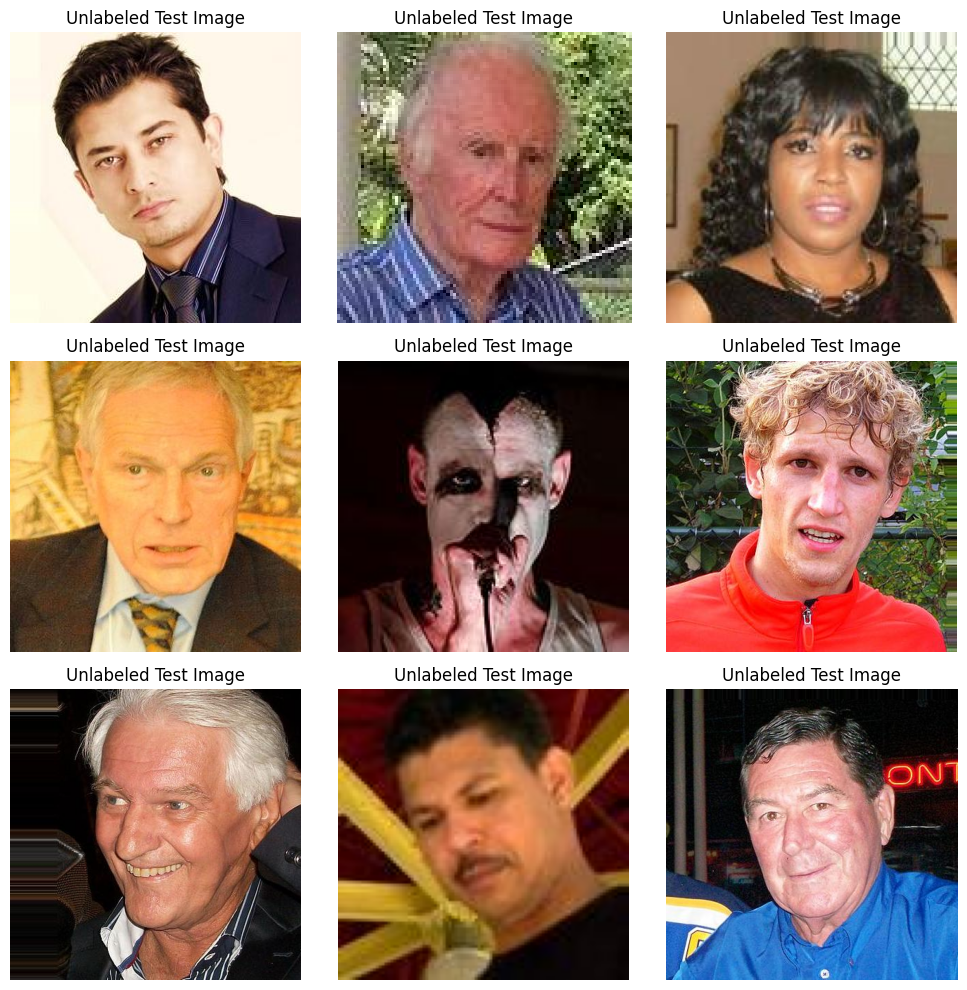

In [79]:
sample_test_df = test_df.sample(min(9, len(test_df)), random_state=42)

plt.figure(figsize=(10, 10))

for i, (_, row) in enumerate(sample_test_df.iterrows()):
    image_path = Path(row["resolved_image_path"])
    image = Image.open(image_path).convert("RGB")

    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title("Unlabeled Test Image")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Save Cleaned CSV Files

We now save the cleaned DataFrames into new CSV files.

The saved files are:

- `train_clean.csv` — labeled training data
- `val_clean.csv` — labeled validation data
- `test_clean.csv` — unlabeled test data

These cleaned files will be used in the next phases for dataset loading, training, validation, and final prediction.

Saving cleaned files makes the project reproducible because we do not need to repeat all cleaning steps every time.

In [80]:
CLEAN_TRAIN_CSV = DATA_DIR / "train_clean.csv"
CLEAN_VAL_CSV = DATA_DIR / "val_clean.csv"
CLEAN_TEST_CSV = DATA_DIR / "test_clean.csv"

train_df.to_csv(CLEAN_TRAIN_CSV, index=False)
val_df.to_csv(CLEAN_VAL_CSV, index=False)
test_df.to_csv(CLEAN_TEST_CSV, index=False)

print("Saved cleaned training CSV:", CLEAN_TRAIN_CSV)
print("Saved cleaned validation CSV:", CLEAN_VAL_CSV)
print("Saved cleaned unlabeled test CSV:", CLEAN_TEST_CSV)

Saved cleaned training CSV: d:\Deep Learning\Dataset\face_dataset\train_clean.csv
Saved cleaned validation CSV: d:\Deep Learning\Dataset\face_dataset\val_clean.csv
Saved cleaned unlabeled test CSV: d:\Deep Learning\Dataset\face_dataset\test_clean.csv


# Final Dataset Summary

Now we summarize the final cleaned dataset.

We check:
- number of training samples
- number of validation samples
- number of unlabeled test samples
- gender distribution in training and validation data
- age group distribution in training and validation data

The test set has no labels, so we do not calculate gender or age distribution for it.

In [81]:
print("Final Dataset Summary")
print("=" * 50)

print("Training samples:", len(train_df))
print("Validation samples:", len(val_df))
print("Unlabeled test samples:", len(test_df))

print("\nGender Distribution — Train:")
display(train_df["gender_label"].map(gender_names).value_counts())

print("\nGender Distribution — Validation:")
display(val_df["gender_label"].map(gender_names).value_counts())

print("\nAge Group Distribution — Train:")
display(train_df["age_group_label"].map(age_group_names).value_counts())

print("\nAge Group Distribution — Validation:")
display(val_df["age_group_label"].map(age_group_names).value_counts())

Final Dataset Summary
Training samples: 27766
Validation samples: 6942
Unlabeled test samples: 8677

Gender Distribution — Train:


gender_label
Male      20860
Female     6906
Name: count, dtype: int64


Gender Distribution — Validation:


gender_label
Male      5224
Female    1718
Name: count, dtype: int64


Age Group Distribution — Train:


age_group_label
Young Adult    12646
Adult          10608
Senior          4413
Child             99
Name: count, dtype: int64


Age Group Distribution — Validation:


age_group_label
Young Adult    3149
Adult          2645
Senior         1121
Child            27
Name: count, dtype: int64

# Import PyTorch Dataset Tools

Now we move from data cleaning to deep learning preparation.

We import the required PyTorch tools for:
- building a custom dataset
- loading images
- creating mini-batches
- applying image transformations

The model cannot directly train from Pandas DataFrames, so we need a PyTorch Dataset class.

In [82]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Define Image Transformations

We now define image preprocessing and augmentation.

For training images, we apply:
- resizing
- random horizontal flipping
- small rotation
- color jitter
- tensor conversion
- ImageNet normalization

For validation and test images, we only apply deterministic preprocessing:
- resizing
- tensor conversion
- ImageNet normalization

We do not apply random augmentation to validation or test data because evaluation must be stable and repeatable.

In [83]:
IMAGE_SIZE = 224

train_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

eval_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Build Custom PyTorch Dataset Class

We create a custom Dataset class for the age and gender prediction task.

For labeled data, the dataset returns:
- image tensor
- gender label
- age group label

For unlabeled test data, the dataset returns:
- image tensor
- image path

This is necessary because the test CSV has no age or gender labels.

In [84]:
class AgeGenderDataset(Dataset):
    def __init__(self, dataframe, transform=None, labeled=True):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform
        self.labeled = labeled

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]

        image_path = Path(row["resolved_image_path"])
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        if self.labeled:
            gender_label = int(row["gender_label"])
            age_group_label = int(row["age_group_label"])

            return image, gender_label, age_group_label

        return image, str(image_path)

# Create Dataset Objects

Now we create PyTorch Dataset objects for:

- training data
- validation data
- unlabeled test data

Training data uses augmentation.
Validation and test data use only clean preprocessing.

In [85]:
train_dataset = AgeGenderDataset(
    dataframe=train_df,
    transform=train_transforms,
    labeled=True
)

val_dataset = AgeGenderDataset(
    dataframe=val_df,
    transform=eval_transforms,
    labeled=True
)

test_dataset = AgeGenderDataset(
    dataframe=test_df,
    transform=eval_transforms,
    labeled=False
)

print("Training dataset size:", len(train_dataset))
print("Validation dataset size:", len(val_dataset))
print("Unlabeled test dataset size:", len(test_dataset))

Training dataset size: 27766
Validation dataset size: 6942
Unlabeled test dataset size: 8677


# Create DataLoaders

DataLoaders create mini-batches for model training and evaluation.

We use:
- shuffle=True for training
- shuffle=False for validation and test

Training data is shuffled so the model does not learn from a fixed image order.
Validation and test data are not shuffled because we want stable evaluation and prediction order.

In [86]:
BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

print("Number of training batches:", len(train_loader))
print("Number of validation batches:", len(val_loader))
print("Number of test batches:", len(test_loader))

Number of training batches: 868
Number of validation batches: 217
Number of test batches: 272


# Inspect One Training Batch

Before building the model, we inspect one batch from the DataLoader.

This confirms that the DataLoader returns the correct shapes:

- images should have shape: `[batch_size, 3, 224, 224]`
- gender labels should have shape: `[batch_size]`
- age group labels should have shape: `[batch_size]`

This step catches dataset errors before training begins.

In [87]:
images, gender_labels, age_group_labels = next(iter(train_loader))

print("Image batch shape:", images.shape)
print("Gender label batch shape:", gender_labels.shape)
print("Age group label batch shape:", age_group_labels.shape)

print("\nFirst 10 gender labels:")
print(gender_labels[:10])

print("\nFirst 10 age group labels:")
print(age_group_labels[:10])

Image batch shape: torch.Size([32, 3, 224, 224])
Gender label batch shape: torch.Size([32])
Age group label batch shape: torch.Size([32])

First 10 gender labels:
tensor([1, 1, 0, 1, 0, 1, 1, 1, 1, 1])

First 10 age group labels:
tensor([1, 2, 1, 1, 2, 2, 2, 1, 3, 1])


# Visualize Tensor Batch

Now we visualize images after transformation.

Since the images are normalized using ImageNet mean and standard deviation, we must unnormalize them before displaying.

This confirms that the transformed tensors still visually represent the original images.

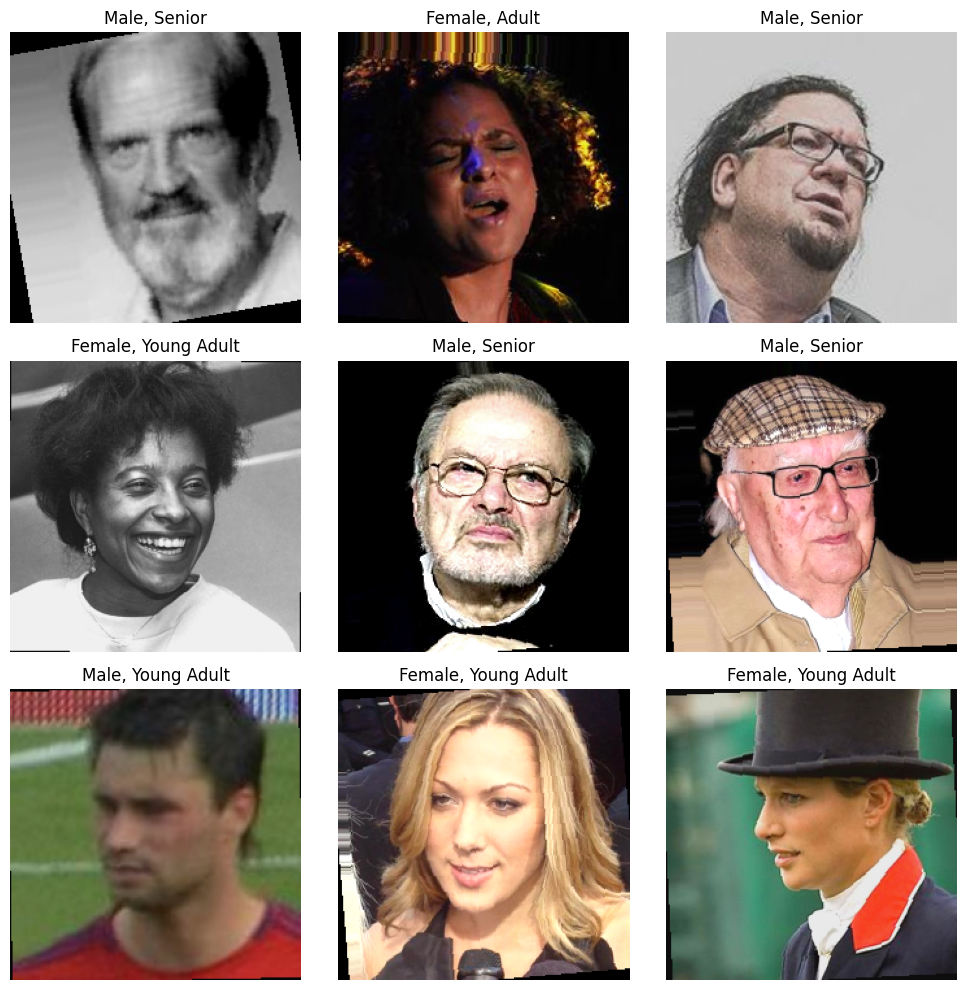

In [88]:
def unnormalize_image(tensor_image):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    image = tensor_image.cpu() * std + mean
    image = image.clamp(0, 1)

    return image.permute(1, 2, 0).numpy()


images, gender_labels, age_group_labels = next(iter(train_loader))

plt.figure(figsize=(10, 10))

for i in range(min(9, images.size(0))):
    image = unnormalize_image(images[i])

    gender = gender_names[int(gender_labels[i])]
    age_group = age_group_names[int(age_group_labels[i])]

    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(f"{gender}, {age_group}")
    plt.axis("off")

plt.tight_layout()
plt.show()

# Set Training Device

Now we define whether the model will run on GPU or CPU.

If CUDA is available, PyTorch will use the GPU.
Otherwise, training will run on CPU.

GPU is preferred for deep learning because model training is much faster.

In [89]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Using device: cuda
GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU


# Build Multi-task ResNet34 Model

In this phase, we build the deep learning model.

We use ResNet34 with transfer learning.

The model has:

- one shared ResNet34 feature extractor
- one gender classification head
- one age group classification head

This is called a multi-task learning architecture.

Instead of training two separate models, one model learns shared facial features and then produces two outputs:

- gender logits
- age group logits

In [90]:
import torch.nn as nn
from torchvision import models


class MultiTaskResNet34(nn.Module):
    def __init__(self, num_gender_classes=2, num_age_classes=4, pretrained=True):
        super(MultiTaskResNet34, self).__init__()

        if pretrained:
            weights = models.ResNet34_Weights.DEFAULT
        else:
            weights = None

        self.backbone = models.resnet34(weights=weights)

        num_features = self.backbone.fc.in_features

        # Remove original ResNet classification layer
        self.backbone.fc = nn.Identity()

        # Gender classification head
        self.gender_head = nn.Sequential(
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_gender_classes)
        )

        # Age group classification head
        self.age_head = nn.Sequential(
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_age_classes)
        )

    def forward(self, x):
        features = self.backbone(x)

        gender_logits = self.gender_head(features)
        age_logits = self.age_head(features)

        return gender_logits, age_logits

# Initialize the Model

Now we create the model object and move it to the selected device.

The number of classes is:

- gender: 2 classes
- age group: 4 classes

We use pretrained ImageNet weights because the model has already learned useful low-level visual features such as edges, textures, and shapes.

In [91]:
NUM_GENDER_CLASSES = 2
NUM_AGE_CLASSES = 4

model = MultiTaskResNet34(
    num_gender_classes=NUM_GENDER_CLASSES,
    num_age_classes=NUM_AGE_CLASSES,
    pretrained=True
)

model = model.to(device)

print(model)

MultiTaskResNet34(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True

# Test One Forward Pass

Before training, we test whether the model can process one batch correctly.

This confirms that:

- image tensors have the correct shape
- the model receives the batch successfully
- the gender output has shape `[batch_size, 2]`
- the age output has shape `[batch_size, 4]`

This step catches architecture errors before training begins.

In [92]:
model.eval()

images, gender_labels, age_group_labels = next(iter(train_loader))
images = images.to(device)

with torch.no_grad():
    gender_outputs, age_outputs = model(images)

print("Input image batch shape:", images.shape)
print("Gender output shape:", gender_outputs.shape)
print("Age output shape:", age_outputs.shape)

Input image batch shape: torch.Size([32, 3, 224, 224])
Gender output shape: torch.Size([32, 2])
Age output shape: torch.Size([32, 4])


# Define Loss Functions and Optimizer

This is a multi-task classification problem.

So we use two CrossEntropyLoss functions:

- one for gender classification
- one for age group classification

The final loss is the sum of both losses:

`total_loss = gender_loss + age_loss`

We use Adam optimizer because it is stable and works well for transfer learning.

In [93]:
import torch.optim as optim

gender_criterion = nn.CrossEntropyLoss()
age_criterion = nn.CrossEntropyLoss()

LEARNING_RATE = 0.001

optimizer = optim.Adam(
    model.parameters(),
    lr=LEARNING_RATE
)

print("Loss functions and optimizer are ready.")

Loss functions and optimizer are ready.


# Define Accuracy Function

We create a helper function to calculate accuracy.

Accuracy tells us how many predictions were correct out of the total number of samples.

We will calculate accuracy separately for:

- gender prediction
- age group prediction

In [94]:
def calculate_accuracy(outputs, labels):
    _, predictions = torch.max(outputs, dim=1)
    correct = (predictions == labels).sum().item()
    total = labels.size(0)
    return correct, total

# Training Function for One Epoch

This function trains the model for one epoch.

For every batch:

1. images and labels are moved to the device
2. model makes gender and age predictions
3. gender loss and age loss are calculated
4. total loss is created
5. gradients are reset
6. backpropagation is performed
7. optimizer updates the model weights
8. training loss and accuracy are tracked

This is the core training loop.

In [95]:
def train_one_epoch(model, train_loader, optimizer, gender_criterion, age_criterion, device):
    model.train()

    running_loss = 0.0

    gender_correct = 0
    gender_total = 0

    age_correct = 0
    age_total = 0

    for images, gender_labels, age_group_labels in train_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_group_labels = age_group_labels.to(device)

        optimizer.zero_grad()

        gender_outputs, age_outputs = model(images)

        gender_loss = gender_criterion(gender_outputs, gender_labels)
        age_loss = age_criterion(age_outputs, age_group_labels)

        total_loss = gender_loss + age_loss

        total_loss.backward()
        optimizer.step()

        running_loss += total_loss.item()

        gender_batch_correct, gender_batch_total = calculate_accuracy(
            gender_outputs,
            gender_labels
        )

        age_batch_correct, age_batch_total = calculate_accuracy(
            age_outputs,
            age_group_labels
        )

        gender_correct += gender_batch_correct
        gender_total += gender_batch_total

        age_correct += age_batch_correct
        age_total += age_batch_total

    epoch_loss = running_loss / len(train_loader)
    gender_accuracy = gender_correct / gender_total
    age_accuracy = age_correct / age_total

    return epoch_loss, gender_accuracy, age_accuracy

# Validation Function

This function evaluates the model on the validation set.

During validation:

- the model is set to evaluation mode
- gradients are disabled
- weights are not updated
- validation loss and accuracy are calculated

We validate on `val_loader`, not on `test_loader`.

The test set has no labels, so it cannot be used for accuracy calculation.

In [96]:
def validate_one_epoch(model, val_loader, gender_criterion, age_criterion, device):
    model.eval()

    running_loss = 0.0

    gender_correct = 0
    gender_total = 0

    age_correct = 0
    age_total = 0

    with torch.no_grad():
        for images, gender_labels, age_group_labels in val_loader:
            images = images.to(device)
            gender_labels = gender_labels.to(device)
            age_group_labels = age_group_labels.to(device)

            gender_outputs, age_outputs = model(images)

            gender_loss = gender_criterion(gender_outputs, gender_labels)
            age_loss = age_criterion(age_outputs, age_group_labels)

            total_loss = gender_loss + age_loss

            running_loss += total_loss.item()

            gender_batch_correct, gender_batch_total = calculate_accuracy(
                gender_outputs,
                gender_labels
            )

            age_batch_correct, age_batch_total = calculate_accuracy(
                age_outputs,
                age_group_labels
            )

            gender_correct += gender_batch_correct
            gender_total += gender_batch_total

            age_correct += age_batch_correct
            age_total += age_batch_total

    epoch_loss = running_loss / len(val_loader)
    gender_accuracy = gender_correct / gender_total
    age_accuracy = age_correct / age_total

    return epoch_loss, gender_accuracy, age_accuracy

# Train the Multi-task Model

Now we train the model for multiple epochs.

For each epoch, we track:

- training loss
- validation loss
- training gender accuracy
- validation gender accuracy
- training age group accuracy
- validation age group accuracy

We save the best model based on validation performance.

Since this is a multi-task model, we use the average of validation gender accuracy and validation age accuracy as the model selection score.

In [97]:
import time
from datetime import timedelta

def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params


total_params, trainable_params = count_parameters(model)

print("Training Setup Summary")
print("=" * 50)
print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("Model: Multi-task ResNet34")
print("Total parameters:", f"{total_params:,}")
print("Trainable parameters:", f"{trainable_params:,}")
print("Training samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))
print("Training batches:", len(train_loader))
print("Validation batches:", len(val_loader))
print("Batch size:", BATCH_SIZE)
print("Image size:", IMAGE_SIZE)
print("Learning rate:", LEARNING_RATE)
print("Planned epochs:", NUM_EPOCHS)

Training Setup Summary
Device: cuda
GPU: NVIDIA GeForce RTX 3070 Ti Laptop GPU
Model: Multi-task ResNet34
Total parameters: 21,548,870
Trainable parameters: 21,548,870
Training samples: 27766
Validation samples: 6942
Training batches: 868
Validation batches: 217
Batch size: 32
Image size: 224
Learning rate: 0.001
Planned epochs: 5


In [98]:
NUM_EPOCHS = 5

MODEL_SAVE_PATH = MODEL_DIR / "multitask_resnet34.pth"

history = {
    "train_loss": [],
    "val_loss": [],
    "train_gender_acc": [],
    "val_gender_acc": [],
    "train_age_acc": [],
    "val_age_acc": [],
    "val_score": [],
    "epoch_time_seconds": []
}

best_val_score = 0.0

training_start_time = time.time()

print("Starting training...")
print("=" * 70)

for epoch in range(NUM_EPOCHS):
    epoch_start_time = time.time()

    train_loss, train_gender_acc, train_age_acc = train_one_epoch(
        model=model,
        train_loader=train_loader,
        optimizer=optimizer,
        gender_criterion=gender_criterion,
        age_criterion=age_criterion,
        device=device
    )

    val_loss, val_gender_acc, val_age_acc = validate_one_epoch(
        model=model,
        val_loader=val_loader,
        gender_criterion=gender_criterion,
        age_criterion=age_criterion,
        device=device
    )

    val_score = (val_gender_acc + val_age_acc) / 2

    epoch_end_time = time.time()
    epoch_time = epoch_end_time - epoch_start_time

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["train_gender_acc"].append(train_gender_acc)
    history["val_gender_acc"].append(val_gender_acc)
    history["train_age_acc"].append(train_age_acc)
    history["val_age_acc"].append(val_age_acc)
    history["val_score"].append(val_score)
    history["epoch_time_seconds"].append(epoch_time)

    print(f"Epoch [{epoch + 1}/{NUM_EPOCHS}]")
    print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
    print(f"Train Gender Acc: {train_gender_acc:.4f} | Val Gender Acc: {val_gender_acc:.4f}")
    print(f"Train Age Acc: {train_age_acc:.4f} | Val Age Acc: {val_age_acc:.4f}")
    print(f"Validation Score: {val_score:.4f}")
    print(f"Epoch Time: {str(timedelta(seconds=int(epoch_time)))}")
    print("-" * 70)

    if val_score > best_val_score:
        best_val_score = val_score

        torch.save({
            "model_state_dict": model.state_dict(),
            "gender_names": gender_names,
            "age_group_names": age_group_names,
            "image_size": IMAGE_SIZE,
            "best_val_score": best_val_score,
            "history": history,
            "num_gender_classes": NUM_GENDER_CLASSES,
            "num_age_classes": NUM_AGE_CLASSES
        }, MODEL_SAVE_PATH)

        print(f"Best model saved with validation score: {best_val_score:.4f}")
        print("=" * 70)

training_end_time = time.time()
total_training_time = training_end_time - training_start_time

print("Training complete.")
print("=" * 70)
print("Best validation score:", round(best_val_score, 4))
print("Total training time:", str(timedelta(seconds=int(total_training_time))))
print("Average epoch time:", str(timedelta(seconds=int(np.mean(history["epoch_time_seconds"])))))

Starting training...
Epoch [1/5]
Train Loss: 1.1751 | Val Loss: 0.9933
Train Gender Acc: 0.8731 | Val Gender Acc: 0.9127
Train Age Acc: 0.5894 | Val Age Acc: 0.6461
Validation Score: 0.7794
Epoch Time: 0:14:25
----------------------------------------------------------------------
Best model saved with validation score: 0.7794
Epoch [2/5]
Train Loss: 0.9844 | Val Loss: 0.9965
Train Gender Acc: 0.9118 | Val Gender Acc: 0.9326
Train Age Acc: 0.6543 | Val Age Acc: 0.6103
Validation Score: 0.7715
Epoch Time: 0:07:04
----------------------------------------------------------------------
Epoch [3/5]
Train Loss: 0.9055 | Val Loss: 0.9334
Train Gender Acc: 0.9264 | Val Gender Acc: 0.9213
Train Age Acc: 0.6832 | Val Age Acc: 0.6626
Validation Score: 0.7920
Epoch Time: 0:04:23
----------------------------------------------------------------------
Best model saved with validation score: 0.7920
Epoch [4/5]
Train Loss: 0.8551 | Val Loss: 0.8356
Train Gender Acc: 0.9339 | Val Gender Acc: 0.9386
Train

# Plot Training Curves

Now we visualize the training process.

We plot:

- training loss vs validation loss
- gender accuracy curves
- age group accuracy curves

These plots help us understand whether the model is learning properly or overfitting.

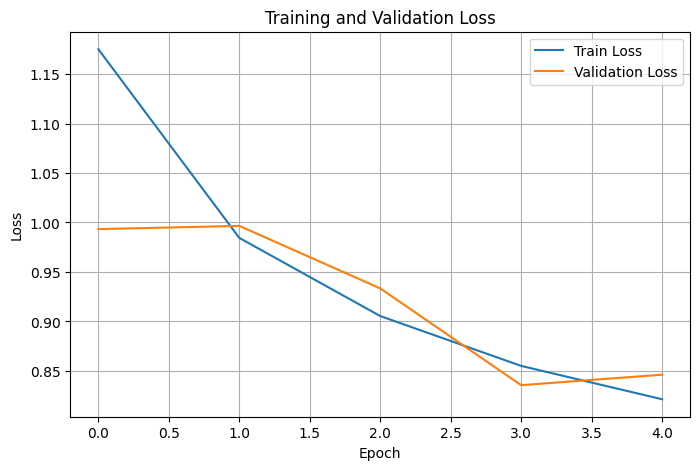

In [99]:
plt.figure(figsize=(8, 5))
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

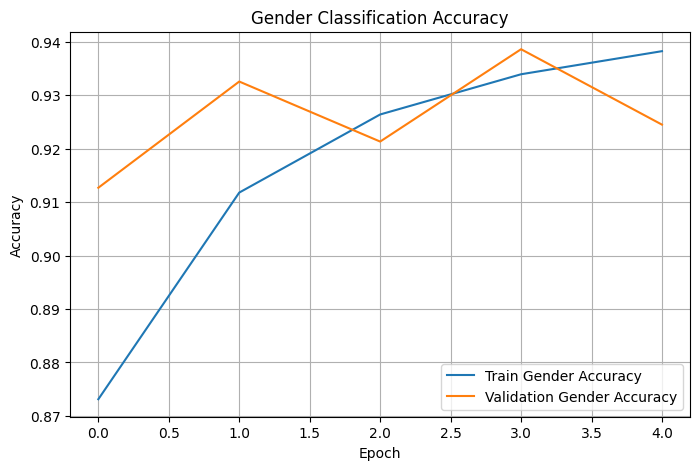

In [101]:
plt.figure(figsize=(8, 5))
plt.plot(history["train_gender_acc"], label="Train Gender Accuracy")
plt.plot(history["val_gender_acc"], label="Validation Gender Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Gender Classification Accuracy")
plt.legend()
plt.grid(True)
plt.show()

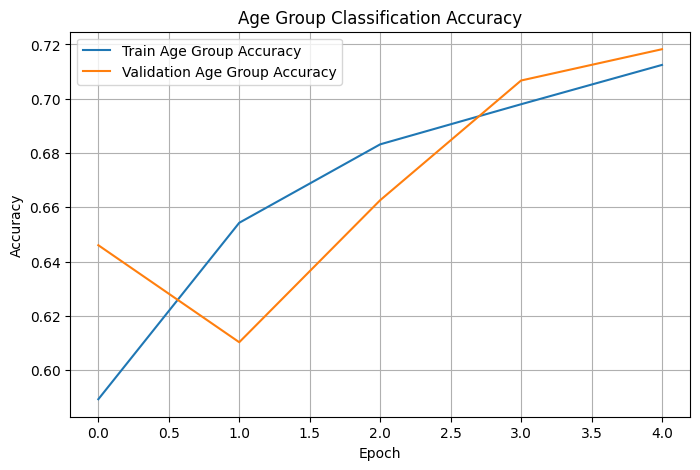

In [102]:
plt.figure(figsize=(8, 5))
plt.plot(history["train_age_acc"], label="Train Age Group Accuracy")
plt.plot(history["val_age_acc"], label="Validation Age Group Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Age Group Classification Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Load Best Saved Model

After training, we reload the best saved model.

This ensures that evaluation is performed using the best validation checkpoint, not just the final epoch model.

In [103]:
checkpoint = torch.load(MODEL_SAVE_PATH, map_location=device)

best_model = MultiTaskResNet34(
    num_gender_classes=NUM_GENDER_CLASSES,
    num_age_classes=NUM_AGE_CLASSES,
    pretrained=False
)

best_model.load_state_dict(checkpoint["model_state_dict"])
best_model = best_model.to(device)
best_model.eval()

print("Best model loaded successfully.")
print("Best validation score:", checkpoint["best_val_score"])

C:\Users\harit\AppData\Local\Temp\ipykernel_30492\182271638.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODEL_SAVE_PATH, map_location=device)

Best model loaded successfully.
Best validation score: 0.8226735811005474


# Collect Validation Predictions

Now we collect all predictions from the validation set.

We need these predictions to calculate detailed metrics such as:

- precision
- recall
- F1-score
- confusion matrix

We calculate these separately for gender and age group prediction.

In [104]:
all_gender_true = []
all_gender_pred = []

all_age_true = []
all_age_pred = []

best_model.eval()

with torch.no_grad():
    for images, gender_labels, age_group_labels in val_loader:
        images = images.to(device)

        gender_outputs, age_outputs = best_model(images)

        _, gender_predictions = torch.max(gender_outputs, dim=1)
        _, age_predictions = torch.max(age_outputs, dim=1)

        all_gender_true.extend(gender_labels.numpy())
        all_gender_pred.extend(gender_predictions.cpu().numpy())

        all_age_true.extend(age_group_labels.numpy())
        all_age_pred.extend(age_predictions.cpu().numpy())

print("Collected validation predictions.")
print("Gender predictions:", len(all_gender_pred))
print("Age predictions:", len(all_age_pred))

Collected validation predictions.
Gender predictions: 6942
Age predictions: 6942


# Classification Reports

Now we calculate classification reports.

These reports show:

- precision
- recall
- F1-score
- support

We create separate reports for:

- gender classification
- age group classification

In [105]:
from sklearn.metrics import classification_report, confusion_matrix

gender_target_names = [gender_names[i] for i in range(NUM_GENDER_CLASSES)]
age_target_names = [age_group_names[i] for i in range(NUM_AGE_CLASSES)]

print("Gender Classification Report:")
print(classification_report(
    all_gender_true,
    all_gender_pred,
    target_names=gender_target_names
))

print("\nAge Group Classification Report:")
print(classification_report(
    all_age_true,
    all_age_pred,
    target_names=age_target_names
))

Gender Classification Report:
              precision    recall  f1-score   support

      Female       0.90      0.85      0.87      1718
        Male       0.95      0.97      0.96      5224

    accuracy                           0.94      6942
   macro avg       0.92      0.91      0.92      6942
weighted avg       0.94      0.94      0.94      6942


Age Group Classification Report:
              precision    recall  f1-score   support

       Child       0.00      0.00      0.00        27
 Young Adult       0.78      0.75      0.77      3149
       Adult       0.62      0.64      0.63      2645
      Senior       0.70      0.74      0.72      1121

    accuracy                           0.71      6942
   macro avg       0.53      0.54      0.53      6942
weighted avg       0.71      0.71      0.71      6942



c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

# Confusion Matrices

A confusion matrix shows where the model is making mistakes.

For gender classification, it shows how often Male/Female predictions are confused.

For age group classification, it shows which age groups are confused with each other.

This is useful for error analysis and interview explanation.

In [106]:
gender_cm = confusion_matrix(all_gender_true, all_gender_pred)
age_cm = confusion_matrix(all_age_true, all_age_pred)

print("Gender Confusion Matrix:")
print(gender_cm)

print("\nAge Group Confusion Matrix:")
print(age_cm)

Gender Confusion Matrix:
[[1459  259]
 [ 167 5057]]

Age Group Confusion Matrix:
[[   0   17    9    1]
 [   0 2377  754   18]
 [   0  614 1694  337]
 [   0   29  257  835]]


# Predict on Unlabeled Test Images

Now we use the trained model to make predictions on the unlabeled test images.

The test set has no true labels, so we cannot calculate accuracy.

Instead, we generate predicted:

- gender label
- gender confidence
- age group label
- age group confidence

These predictions can be saved into a CSV file.

In [107]:
test_predictions = []

best_model.eval()

with torch.no_grad():
    for images, image_paths in test_loader:
        images = images.to(device)

        gender_outputs, age_outputs = best_model(images)

        gender_probs = torch.softmax(gender_outputs, dim=1)
        age_probs = torch.softmax(age_outputs, dim=1)

        gender_confidences, gender_predictions = torch.max(gender_probs, dim=1)
        age_confidences, age_predictions = torch.max(age_probs, dim=1)

        for i in range(len(image_paths)):
            test_predictions.append({
                "image_path": image_paths[i],
                "predicted_gender": gender_names[int(gender_predictions[i].cpu())],
                "gender_confidence": float(gender_confidences[i].cpu()),
                "predicted_age_group": age_group_names[int(age_predictions[i].cpu())],
                "age_confidence": float(age_confidences[i].cpu())
            })

test_predictions_df = pd.DataFrame(test_predictions)

display(test_predictions_df.head())

,image_path,predicted_gender,gender_confidence,predicted_age_group,age_confidence
0,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.999831,Adult,0.905516
1,d:\Deep Learning\Dataset\face_dataset\test\000...,Female,0.997613,Adult,0.746582
2,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.976796,Young Adult,0.454853
3,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.993750,Young Adult,0.630027
4,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.943730,Adult,0.445358


# Save Test Predictions

We save the predictions made on the unlabeled test images.

This creates a final output file that can be included in the project outputs.

In [108]:
TEST_PREDICTIONS_PATH = REPORTS_DIR / "test_predictions.csv"

test_predictions_df.to_csv(TEST_PREDICTIONS_PATH, index=False)

print("Saved test predictions to:", TEST_PREDICTIONS_PATH)

Saved test predictions to: d:\Deep Learning\Dataset\face_dataset\outputs\reports\test_predictions.csv


# Load Best Saved Model

After training, we reload the best saved model checkpoint.

This is important because the final epoch may not be the best model.

During training, we saved the model with the best validation score. Now we load that model and use it for evaluation, prediction, and later Grad-CAM explainability.

In [109]:
MODEL_SAVE_PATH = MODEL_DIR / "multitask_resnet34.pth"

checkpoint = torch.load(MODEL_SAVE_PATH, map_location=device)

best_model = MultiTaskResNet34(
    num_gender_classes=NUM_GENDER_CLASSES,
    num_age_classes=NUM_AGE_CLASSES,
    pretrained=False
)

best_model.load_state_dict(checkpoint["model_state_dict"])
best_model = best_model.to(device)
best_model.eval()

print("Best model loaded successfully.")
print("Best validation score:", checkpoint["best_val_score"])

C:\Users\harit\AppData\Local\Temp\ipykernel_30492\3492595844.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODEL_SAVE_PATH, map_location=device

Best model loaded successfully.
Best validation score: 0.8226735811005474


# Collect Validation Predictions

Now we run the best model on the validation set.

We collect:

- true gender labels
- predicted gender labels
- true age group labels
- predicted age group labels
- prediction confidence scores

These values will be used to calculate detailed metrics and analyze model mistakes.

In [110]:
all_gender_true = []
all_gender_pred = []
all_gender_conf = []

all_age_true = []
all_age_pred = []
all_age_conf = []

all_val_image_paths = []

best_model.eval()

with torch.no_grad():
    for images, gender_labels, age_group_labels in val_loader:
        images = images.to(device)

        gender_outputs, age_outputs = best_model(images)

        gender_probs = torch.softmax(gender_outputs, dim=1)
        age_probs = torch.softmax(age_outputs, dim=1)

        gender_confidences, gender_predictions = torch.max(gender_probs, dim=1)
        age_confidences, age_predictions = torch.max(age_probs, dim=1)

        all_gender_true.extend(gender_labels.numpy())
        all_gender_pred.extend(gender_predictions.cpu().numpy())
        all_gender_conf.extend(gender_confidences.cpu().numpy())

        all_age_true.extend(age_group_labels.numpy())
        all_age_pred.extend(age_predictions.cpu().numpy())
        all_age_conf.extend(age_confidences.cpu().numpy())

print("Validation predictions collected.")
print("Gender predictions:", len(all_gender_pred))
print("Age predictions:", len(all_age_pred))

Validation predictions collected.
Gender predictions: 6942
Age predictions: 6942


# Collect Validation Image Paths

For error analysis, we need to know which image belongs to each prediction.

The validation DataLoader gives the labels, but not the image paths.

So we collect the image paths directly from `val_df` in the same order because validation loading used `shuffle=False`.

In [112]:
all_val_image_paths = val_df["resolved_image_path"].tolist()

print("Validation image paths collected:", len(all_val_image_paths))
print("Validation predictions collected:", len(all_gender_pred))

Validation image paths collected: 6942
Validation predictions collected: 6942


# Build Validation Results DataFrame

We now create a DataFrame containing validation results.

This table includes:

- image path
- true gender
- predicted gender
- gender confidence
- true age group
- predicted age group
- age confidence
- whether each prediction was correct

This makes error analysis much easier.

In [113]:
val_results_df = pd.DataFrame({
    "image_path": all_val_image_paths,
    "true_gender": [gender_names[int(x)] for x in all_gender_true],
    "predicted_gender": [gender_names[int(x)] for x in all_gender_pred],
    "gender_confidence": all_gender_conf,
    "true_age_group": [age_group_names[int(x)] for x in all_age_true],
    "predicted_age_group": [age_group_names[int(x)] for x in all_age_pred],
    "age_confidence": all_age_conf
})

val_results_df["gender_correct"] = val_results_df["true_gender"] == val_results_df["predicted_gender"]
val_results_df["age_correct"] = val_results_df["true_age_group"] == val_results_df["predicted_age_group"]

display(val_results_df.head())

,image_path,true_gender,predicted_gender,gender_confidence,true_age_group,predicted_age_group,age_confidence,gender_correct,age_correct
0,d:\Deep Learning\Dataset\face_dataset\train\31...,Male,Male,0.998187,Adult,Young Adult,0.606946,True,False
1,d:\Deep Learning\Dataset\face_dataset\train\21...,Male,Male,0.999853,Senior,Senior,0.961161,True,True
2,d:\Deep Learning\Dataset\face_dataset\train\23...,Female,Female,0.988535,Adult,Adult,0.578179,True,True
3,d:\Deep Learning\Dataset\face_dataset\train\09...,Male,Male,0.995787,Adult,Adult,0.531980,True,True
4,d:\Deep Learning\Dataset\face_dataset\train\30...,Male,Male,0.982074,Young Adult,Young Adult,0.574914,True,True


# Classification Reports

Now we calculate detailed classification reports.

Accuracy alone is not enough.

The classification report gives:

- precision
- recall
- F1-score
- support

We calculate separate reports for:

- gender classification
- age group classification

In [114]:
from sklearn.metrics import classification_report, accuracy_score

gender_target_names = [gender_names[i] for i in range(NUM_GENDER_CLASSES)]
age_target_names = [age_group_names[i] for i in range(NUM_AGE_CLASSES)]

gender_accuracy = accuracy_score(all_gender_true, all_gender_pred)
age_accuracy = accuracy_score(all_age_true, all_age_pred)

print("Gender Accuracy:", round(gender_accuracy, 4))
print("Age Group Accuracy:", round(age_accuracy, 4))

print("\nGender Classification Report:")
print(classification_report(
    all_gender_true,
    all_gender_pred,
    target_names=gender_target_names
))

print("\nAge Group Classification Report:")
print(classification_report(
    all_age_true,
    all_age_pred,
    target_names=age_target_names
))

Gender Accuracy: 0.9386
Age Group Accuracy: 0.7067

Gender Classification Report:
              precision    recall  f1-score   support

      Female       0.90      0.85      0.87      1718
        Male       0.95      0.97      0.96      5224

    accuracy                           0.94      6942
   macro avg       0.92      0.91      0.92      6942
weighted avg       0.94      0.94      0.94      6942


Age Group Classification Report:
              precision    recall  f1-score   support

       Child       0.00      0.00      0.00        27
 Young Adult       0.78      0.75      0.77      3149
       Adult       0.62      0.64      0.63      2645
      Senior       0.70      0.74      0.72      1121

    accuracy                           0.71      6942
   macro avg       0.53      0.54      0.53      6942
weighted avg       0.71      0.71      0.71      6942



c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\harit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

# Confusion Matrices

A confusion matrix shows where the model is making mistakes.

For gender prediction, it shows whether Male and Female are being confused.

For age group prediction, it shows which age groups are being confused with each other.

This is useful for understanding model weaknesses beyond accuracy.

In [115]:
from sklearn.metrics import confusion_matrix

gender_cm = confusion_matrix(all_gender_true, all_gender_pred)
age_cm = confusion_matrix(all_age_true, all_age_pred)

print("Gender Confusion Matrix:")
print(gender_cm)

print("\nAge Group Confusion Matrix:")
print(age_cm)

Gender Confusion Matrix:
[[1459  259]
 [ 167 5057]]

Age Group Confusion Matrix:
[[   0   17    9    1]
 [   0 2377  754   18]
 [   0  614 1694  337]
 [   0   29  257  835]]


# Plot Confusion Matrices

Now we visualize the confusion matrices.

This is easier to understand than raw numbers and can later be used in the README or project report.

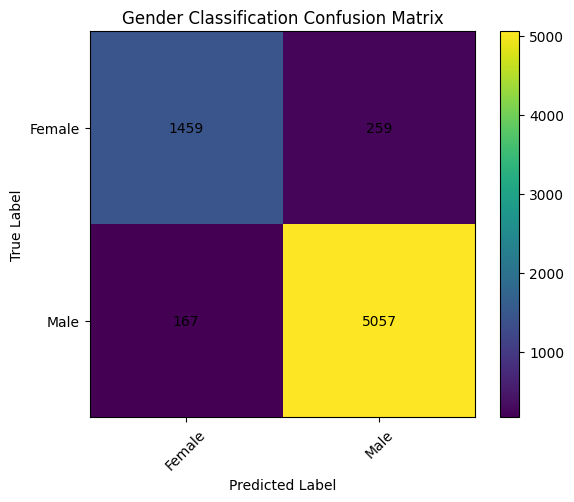

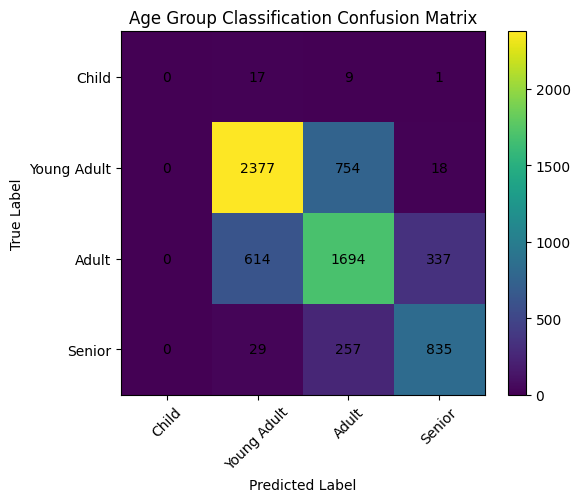

In [116]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, class_names, title):
    plt.figure(figsize=(6, 5))
    plt.imshow(cm)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, cm[i, j], ha="center", va="center")

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()


plot_confusion_matrix(
    gender_cm,
    gender_target_names,
    "Gender Classification Confusion Matrix"
)

plot_confusion_matrix(
    age_cm,
    age_target_names,
    "Age Group Classification Confusion Matrix"
)

# Save Evaluation Reports

Now we save validation results and summary metrics.

This helps make the project reproducible and gives us files that can be referenced in the README.

In [117]:
VAL_RESULTS_PATH = REPORTS_DIR / "validation_predictions.csv"
METRICS_SUMMARY_PATH = REPORTS_DIR / "metrics_summary.csv"

val_results_df.to_csv(VAL_RESULTS_PATH, index=False)

metrics_summary_df = pd.DataFrame({
    "metric": [
        "gender_accuracy",
        "age_group_accuracy",
        "average_validation_score"
    ],
    "value": [
        gender_accuracy,
        age_accuracy,
        (gender_accuracy + age_accuracy) / 2
    ]
})

metrics_summary_df.to_csv(METRICS_SUMMARY_PATH, index=False)

print("Saved validation predictions to:", VAL_RESULTS_PATH)
print("Saved metrics summary to:", METRICS_SUMMARY_PATH)

display(metrics_summary_df)

Saved validation predictions to: d:\Deep Learning\Dataset\face_dataset\outputs\reports\validation_predictions.csv
Saved metrics summary to: d:\Deep Learning\Dataset\face_dataset\outputs\reports\metrics_summary.csv


,metric,value
0,gender_accuracy,0.938634
1,age_group_accuracy,0.706713
2,average_validation_score,0.822674


# Error Analysis

Now we inspect wrong predictions.

This is important because a strong project should not only show accuracy. It should also show where the model fails.

We analyze:

- wrong gender predictions
- wrong age group predictions
- low-confidence predictions

This helps explain model limitations in an interview.

In [118]:
wrong_gender_df = val_results_df[val_results_df["gender_correct"] == False]
wrong_age_df = val_results_df[val_results_df["age_correct"] == False]

print("Wrong gender predictions:", len(wrong_gender_df))
print("Wrong age group predictions:", len(wrong_age_df))

print("\nSample wrong gender predictions:")
display(wrong_gender_df.head())

print("\nSample wrong age group predictions:")
display(wrong_age_df.head())

Wrong gender predictions: 426
Wrong age group predictions: 2036

Sample wrong gender predictions:


,image_path,true_gender,predicted_gender,gender_confidence,true_age_group,predicted_age_group,age_confidence,gender_correct,age_correct
51,d:\Deep Learning\Dataset\face_dataset\train\14...,Female,Male,0.990603,Young Adult,Adult,0.602571,False,False
52,d:\Deep Learning\Dataset\face_dataset\train\30...,Female,Male,0.727652,Adult,Senior,0.596934,False,False
112,d:\Deep Learning\Dataset\face_dataset\train\06...,Male,Female,0.780522,Young Adult,Young Adult,0.721099,False,True
135,d:\Deep Learning\Dataset\face_dataset\train\03...,Female,Male,0.549025,Young Adult,Young Adult,0.763956,False,True
149,d:\Deep Learning\Dataset\face_dataset\train\21...,Female,Male,0.701331,Young Adult,Adult,0.485919,False,False



Sample wrong age group predictions:


,image_path,true_gender,predicted_gender,gender_confidence,true_age_group,predicted_age_group,age_confidence,gender_correct,age_correct
0,d:\Deep Learning\Dataset\face_dataset\train\31...,Male,Male,0.998187,Adult,Young Adult,0.606946,True,False
8,d:\Deep Learning\Dataset\face_dataset\train\27...,Female,Female,0.964327,Adult,Young Adult,0.672086,True,False
10,d:\Deep Learning\Dataset\face_dataset\train\03...,Male,Male,0.973884,Young Adult,Adult,0.511722,True,False
12,d:\Deep Learning\Dataset\face_dataset\train\27...,Male,Male,0.992879,Adult,Young Adult,0.708809,True,False
16,d:\Deep Learning\Dataset\face_dataset\train\22...,Female,Female,0.992745,Young Adult,Adult,0.601563,True,False


# Visualize Wrong Age Predictions

Age group prediction is usually harder than gender prediction.

Here we visualize some wrong age predictions to understand what types of images confuse the model.

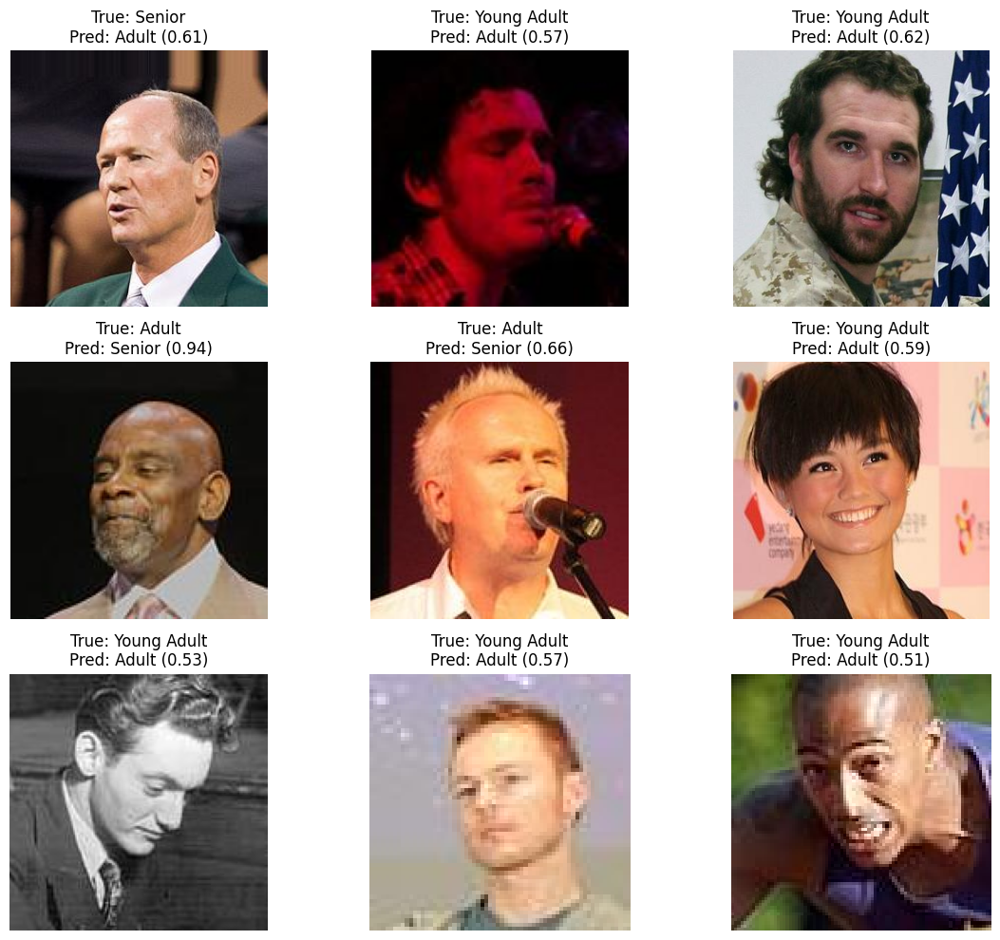

In [119]:
sample_wrong_age = wrong_age_df.sample(
    min(9, len(wrong_age_df)),
    random_state=42
) if len(wrong_age_df) > 0 else wrong_age_df

if len(sample_wrong_age) == 0:
    print("No wrong age predictions found.")
else:
    plt.figure(figsize=(12, 10))

    for i, (_, row) in enumerate(sample_wrong_age.iterrows()):
        image = Image.open(row["image_path"]).convert("RGB")

        title = (
            f"True: {row['true_age_group']}\n"
            f"Pred: {row['predicted_age_group']} "
            f"({row['age_confidence']:.2f})"
        )

        plt.subplot(3, 3, i + 1)
        plt.imshow(image)
        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Visualize Wrong Gender Predictions

Now we visualize wrong gender predictions.

This helps identify possible issues such as:

- poor image quality
- unusual lighting
- occlusion
- hairstyle or facial feature ambiguity
- incorrect labels in the dataset

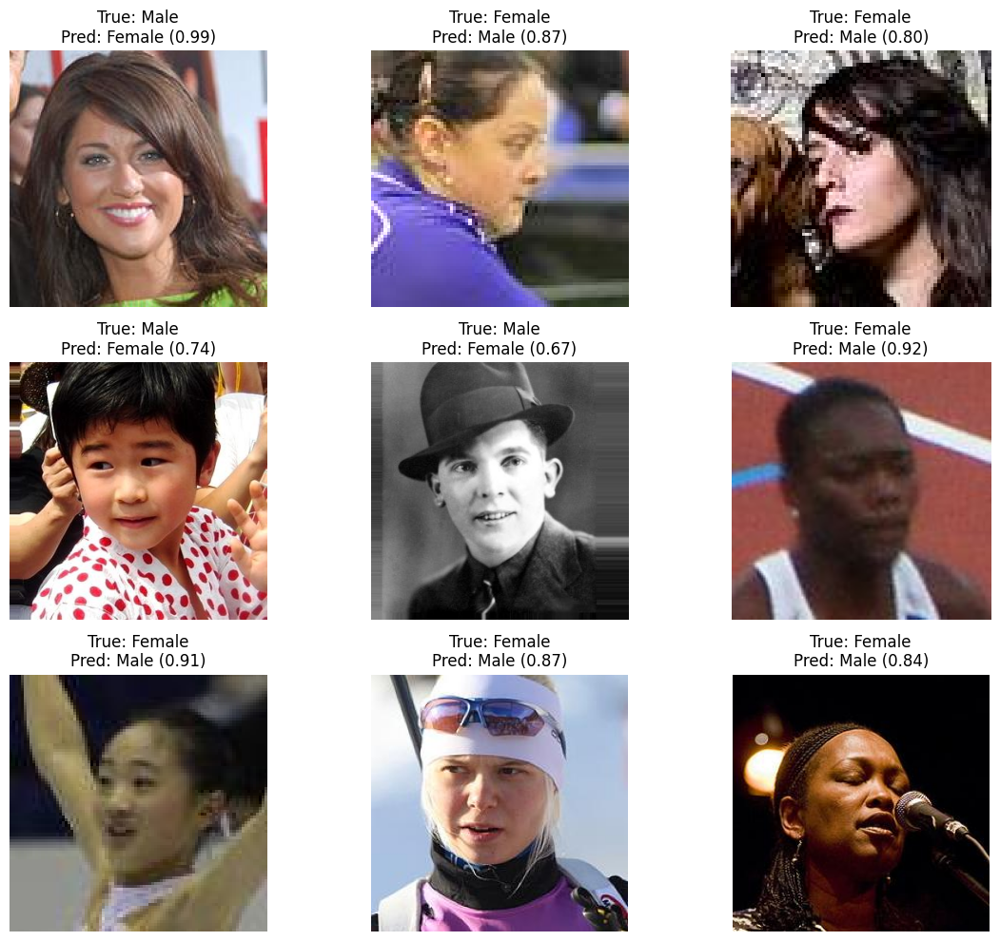

In [120]:
sample_wrong_gender = wrong_gender_df.sample(
    min(9, len(wrong_gender_df)),
    random_state=42
) if len(wrong_gender_df) > 0 else wrong_gender_df

if len(sample_wrong_gender) == 0:
    print("No wrong gender predictions found.")
else:
    plt.figure(figsize=(12, 10))

    for i, (_, row) in enumerate(sample_wrong_gender.iterrows()):
        image = Image.open(row["image_path"]).convert("RGB")

        title = (
            f"True: {row['true_gender']}\n"
            f"Pred: {row['predicted_gender']} "
            f"({row['gender_confidence']:.2f})"
        )

        plt.subplot(3, 3, i + 1)
        plt.imshow(image)
        plt.title(title)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Predict on Unlabeled Test Images

Now we use the trained model to make predictions on the unlabeled test set.

The test CSV does not contain true age or gender labels, so we cannot calculate accuracy.

Instead, we generate:

- predicted gender
- gender confidence
- predicted age group
- age group confidence

These predictions are saved later as a CSV file.

In [121]:
test_predictions = []

best_model.eval()

with torch.no_grad():
    for images, image_paths in test_loader:
        images = images.to(device)

        gender_outputs, age_outputs = best_model(images)

        gender_probs = torch.softmax(gender_outputs, dim=1)
        age_probs = torch.softmax(age_outputs, dim=1)

        gender_confidences, gender_predictions = torch.max(gender_probs, dim=1)
        age_confidences, age_predictions = torch.max(age_probs, dim=1)

        for i in range(len(image_paths)):
            test_predictions.append({
                "image_path": image_paths[i],
                "predicted_gender": gender_names[int(gender_predictions[i].cpu())],
                "gender_confidence": float(gender_confidences[i].cpu()),
                "predicted_age_group": age_group_names[int(age_predictions[i].cpu())],
                "age_confidence": float(age_confidences[i].cpu())
            })

test_predictions_df = pd.DataFrame(test_predictions)

display(test_predictions_df.head())

,image_path,predicted_gender,gender_confidence,predicted_age_group,age_confidence
0,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.999831,Adult,0.905516
1,d:\Deep Learning\Dataset\face_dataset\test\000...,Female,0.997613,Adult,0.746582
2,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.976796,Young Adult,0.454853
3,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.993750,Young Adult,0.630027
4,d:\Deep Learning\Dataset\face_dataset\test\000...,Male,0.943730,Adult,0.445358


# Save Test Predictions

We save predictions on the unlabeled test set.

This file can be used as a final project output.

In [122]:
TEST_PREDICTIONS_PATH = REPORTS_DIR / "test_predictions.csv"

test_predictions_df.to_csv(TEST_PREDICTIONS_PATH, index=False)

print("Saved test predictions to:", TEST_PREDICTIONS_PATH)

Saved test predictions to: d:\Deep Learning\Dataset\face_dataset\outputs\reports\test_predictions.csv


# Visualize Test Predictions

Now we visualize a few predictions from the unlabeled test set.

Since there are no true labels, we only show the predicted gender and age group with confidence scores.

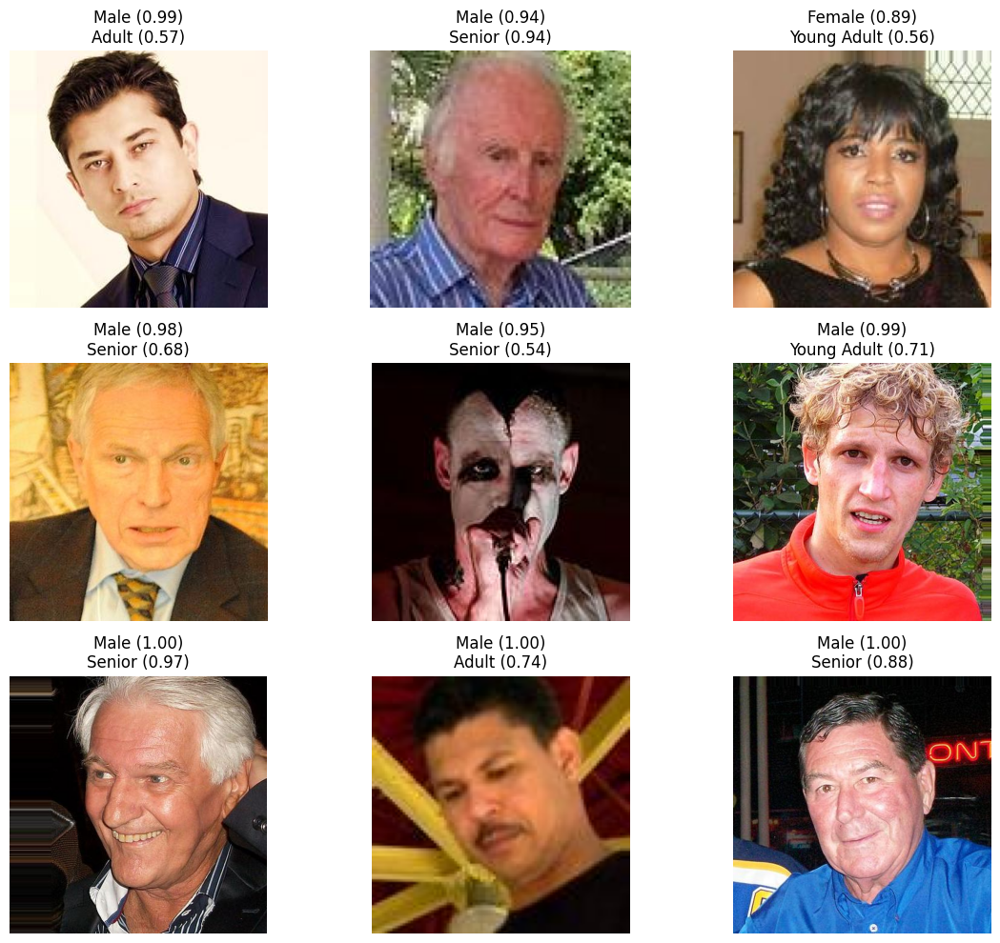

In [123]:
sample_test_predictions = test_predictions_df.sample(
    min(9, len(test_predictions_df)),
    random_state=42
)

plt.figure(figsize=(12, 10))

for i, (_, row) in enumerate(sample_test_predictions.iterrows()):
    image = Image.open(row["image_path"]).convert("RGB")

    title = (
        f"{row['predicted_gender']} ({row['gender_confidence']:.2f})\n"
        f"{row['predicted_age_group']} ({row['age_confidence']:.2f})"
    )

    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

# Single Image Prediction Function

Now we create a function to predict age group and gender for one image.

This function will later be reused in the Streamlit app.

Input:
- image path

Output:
- predicted gender
- gender confidence
- predicted age group
- age confidence

In [124]:
def predict_single_image(image_path, model, transform, device):
    model.eval()

    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        gender_outputs, age_outputs = model(input_tensor)

        gender_probs = torch.softmax(gender_outputs, dim=1)
        age_probs = torch.softmax(age_outputs, dim=1)

        gender_confidence, gender_prediction = torch.max(gender_probs, dim=1)
        age_confidence, age_prediction = torch.max(age_probs, dim=1)

    result = {
        "predicted_gender": gender_names[int(gender_prediction.item())],
        "gender_confidence": float(gender_confidence.item()),
        "predicted_age_group": age_group_names[int(age_prediction.item())],
        "age_confidence": float(age_confidence.item())
    }

    return result

# Test Single Image Prediction

We now test the single-image prediction function using one image from the test set.

This confirms that the reusable prediction function works correctly before we move it into the Streamlit application.

Image: d:\Deep Learning\Dataset\face_dataset\test\00000.jpg
Predicted Gender: Male
Gender Confidence: 0.9998
Predicted Age Group: Adult
Age Confidence: 0.9055


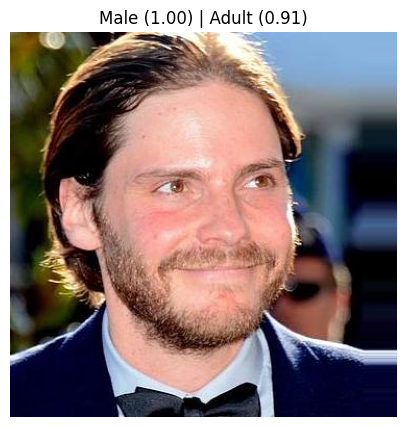

In [125]:
sample_image_path = test_predictions_df.iloc[0]["image_path"]

result = predict_single_image(
    image_path=sample_image_path,
    model=best_model,
    transform=eval_transforms,
    device=device
)

print("Image:", sample_image_path)
print("Predicted Gender:", result["predicted_gender"])
print("Gender Confidence:", round(result["gender_confidence"], 4))
print("Predicted Age Group:", result["predicted_age_group"])
print("Age Confidence:", round(result["age_confidence"], 4))

image = Image.open(sample_image_path).convert("RGB")
plt.figure(figsize=(5, 5))
plt.imshow(image)
plt.title(
    f"{result['predicted_gender']} ({result['gender_confidence']:.2f}) | "
    f"{result['predicted_age_group']} ({result['age_confidence']:.2f})"
)
plt.axis("off")
plt.show()

# Grad-CAM Explainability

In this phase, we add explainability using Grad-CAM.

Grad-CAM stands for Gradient-weighted Class Activation Mapping.

It helps us visualize which regions of the input image influenced the model's prediction.

For this project, Grad-CAM is useful because the model predicts facial attributes:

- gender
- age group

The heatmap helps us inspect whether the model is focusing on relevant face regions instead of irrelevant background areas.

Since this is a multi-task model, we will generate Grad-CAM separately for:

- gender prediction
- age group prediction

# Select Target Layer

Grad-CAM is usually applied to the last convolutional layer of a CNN.

For ResNet34, the final convolutional block is:

`model.backbone.layer4[-1]`

This layer contains high-level visual features and still preserves spatial information, making it suitable for heatmap generation.

In [126]:
target_layer = best_model.backbone.layer4[-1]

print("Target layer selected:")
print(target_layer)

Target layer selected:
BasicBlock(
  (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)


# Build Grad-CAM Class

Now we implement Grad-CAM.

The class works by:

1. registering hooks on the target convolutional layer
2. saving activations during the forward pass
3. saving gradients during the backward pass
4. weighting activations using gradients
5. creating a heatmap
6. normalizing the heatmap between 0 and 1

This implementation supports both model outputs:

- `task="gender"`
- `task="age"`

In [128]:
import torch.nn.functional as F

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.forward_hook = self.target_layer.register_forward_hook(self.save_activations)
        self.backward_hook = self.target_layer.register_full_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_cam(self, input_tensor, task="gender", target_class=None):
        self.model.eval()

        self.model.zero_grad()

        gender_output, age_output = self.model(input_tensor)

        if task == "gender":
            output = gender_output
        elif task == "age":
            output = age_output
        else:
            raise ValueError("task must be either 'gender' or 'age'")

        if target_class is None:
            target_class = output.argmax(dim=1).item()

        target_score = output[:, target_class]
        target_score.backward()

        gradients = self.gradients
        activations = self.activations

        weights = gradients.mean(dim=(2, 3), keepdim=True)

        cam = (weights * activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = F.interpolate(
            cam,
            size=(IMAGE_SIZE, IMAGE_SIZE),
            mode="bilinear",
            align_corners=False
        )

        cam = cam.squeeze().detach().cpu().numpy()

        cam_min = cam.min()
        cam_max = cam.max()

        if cam_max - cam_min != 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = np.zeros_like(cam)

        return cam, target_class

    def remove_hooks(self):
        self.forward_hook.remove()
        self.backward_hook.remove()

# Prepare Image for Grad-CAM

Now we create a helper function that:

- loads an image
- converts it to RGB
- applies the same validation transform used during model evaluation
- adds a batch dimension
- moves the tensor to the selected device

This keeps Grad-CAM input consistent with the model's training and validation preprocessing.

In [129]:
def prepare_image_for_gradcam(image_path, transform, device):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    return image, input_tensor

# Overlay Grad-CAM Heatmap

The Grad-CAM output is a heatmap.

To make it easier to understand, we overlay the heatmap on top of the original image.

This creates a visual explanation showing which parts of the image influenced the model's prediction.

In [130]:
import cv2

def overlay_heatmap_on_image(original_image, heatmap, alpha=0.4):
    original_image = original_image.resize((IMAGE_SIZE, IMAGE_SIZE))
    original_np = np.array(original_image)

    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_np, 1 - alpha, heatmap_color, alpha, 0)

    return overlay

# Generate Grad-CAM for One Image

Now we test Grad-CAM on a single image.

We generate two heatmaps:

- one for gender prediction
- one for age group prediction

This helps us inspect whether the model focuses on meaningful facial regions for both tasks.

In [131]:
sample_image_path = test_predictions_df.iloc[0]["image_path"]

original_image, input_tensor = prepare_image_for_gradcam(
    image_path=sample_image_path,
    transform=eval_transforms,
    device=device
)

gradcam = GradCAM(best_model, target_layer)

gender_cam, gender_target_class = gradcam.generate_cam(
    input_tensor=input_tensor,
    task="gender"
)

age_cam, age_target_class = gradcam.generate_cam(
    input_tensor=input_tensor,
    task="age"
)

gender_overlay = overlay_heatmap_on_image(original_image, gender_cam)
age_overlay = overlay_heatmap_on_image(original_image, age_cam)

gradcam.remove_hooks()

print("Gender target class:", gender_names[gender_target_class])
print("Age target class:", age_group_names[age_target_class])

Gender target class: Male
Age target class: Adult


# Visualize Grad-CAM Outputs

Now we display:

- original image
- gender Grad-CAM overlay
- age group Grad-CAM overlay

This gives a side-by-side explanation of the model's attention for both prediction tasks.

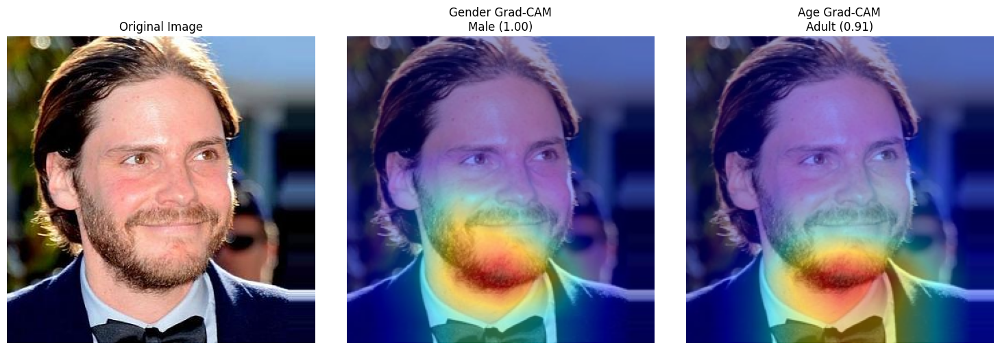

In [132]:
prediction_result = predict_single_image(
    image_path=sample_image_path,
    model=best_model,
    transform=eval_transforms,
    device=device
)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(gender_overlay)
plt.title(
    f"Gender Grad-CAM\n"
    f"{prediction_result['predicted_gender']} "
    f"({prediction_result['gender_confidence']:.2f})"
)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(age_overlay)
plt.title(
    f"Age Grad-CAM\n"
    f"{prediction_result['predicted_age_group']} "
    f"({prediction_result['age_confidence']:.2f})"
)
plt.axis("off")

plt.tight_layout()
plt.show()

# Reusable Grad-CAM Function

Now we create a reusable function that generates Grad-CAM visualizations for any image.

This function will later be useful for:

- testing multiple images
- saving Grad-CAM examples
- integrating Grad-CAM into the Streamlit app

In [133]:
def generate_gradcam_visualization(image_path, model, transform, device):
    original_image, input_tensor = prepare_image_for_gradcam(
        image_path=image_path,
        transform=transform,
        device=device
    )

    target_layer = model.backbone.layer4[-1]
    gradcam = GradCAM(model, target_layer)

    gender_cam, gender_target_class = gradcam.generate_cam(
        input_tensor=input_tensor,
        task="gender"
    )

    age_cam, age_target_class = gradcam.generate_cam(
        input_tensor=input_tensor,
        task="age"
    )

    gradcam.remove_hooks()

    gender_overlay = overlay_heatmap_on_image(original_image, gender_cam)
    age_overlay = overlay_heatmap_on_image(original_image, age_cam)

    prediction_result = predict_single_image(
        image_path=image_path,
        model=model,
        transform=transform,
        device=device
    )

    return {
        "original_image": original_image,
        "gender_overlay": gender_overlay,
        "age_overlay": age_overlay,
        "prediction_result": prediction_result
    }

# Test Reusable Grad-CAM Function

We now test the reusable Grad-CAM function on one image.

This confirms that the Grad-CAM pipeline works as a standalone component.

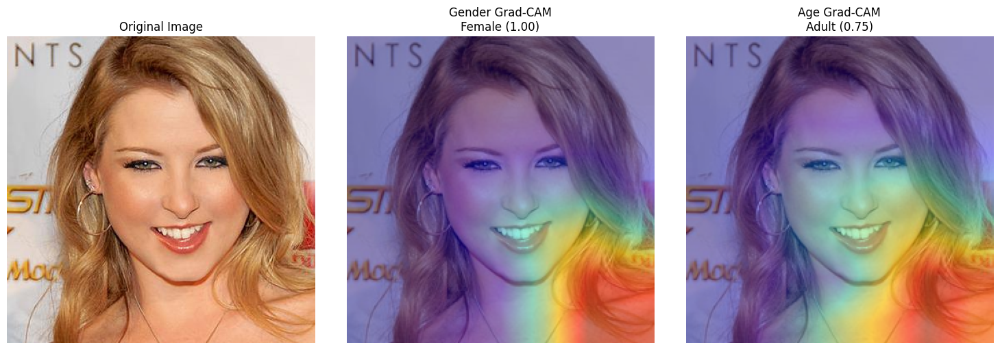

In [134]:
sample_image_path = test_predictions_df.iloc[1]["image_path"]

gradcam_result = generate_gradcam_visualization(
    image_path=sample_image_path,
    model=best_model,
    transform=eval_transforms,
    device=device
)

prediction_result = gradcam_result["prediction_result"]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gradcam_result["original_image"])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(gradcam_result["gender_overlay"])
plt.title(
    f"Gender Grad-CAM\n"
    f"{prediction_result['predicted_gender']} "
    f"({prediction_result['gender_confidence']:.2f})"
)
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(gradcam_result["age_overlay"])
plt.title(
    f"Age Grad-CAM\n"
    f"{prediction_result['predicted_age_group']} "
    f"({prediction_result['age_confidence']:.2f})"
)
plt.axis("off")

plt.tight_layout()
plt.show()

# Save Grad-CAM Example Images

Now we save Grad-CAM example images.

These saved images can be used in:

- README
- portfolio screenshots
- project explanation
- demo documentation

This is important because the final project should show visual proof of explainability, not only code.

In [135]:
GRADCAM_DIR = OUTPUT_DIR / "gradcam_examples"
GRADCAM_DIR.mkdir(exist_ok=True)

sample_gradcam_df = test_predictions_df.sample(
    min(5, len(test_predictions_df)),
    random_state=42
)

saved_gradcam_paths = []

for idx, row in sample_gradcam_df.iterrows():
    image_path = row["image_path"]

    result = generate_gradcam_visualization(
        image_path=image_path,
        model=best_model,
        transform=eval_transforms,
        device=device
    )

    prediction = result["prediction_result"]

    fig = plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(result["original_image"])
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(result["gender_overlay"])
    plt.title(
        f"Gender: {prediction['predicted_gender']}\n"
        f"Conf: {prediction['gender_confidence']:.2f}"
    )
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(result["age_overlay"])
    plt.title(
        f"Age: {prediction['predicted_age_group']}\n"
        f"Conf: {prediction['age_confidence']:.2f}"
    )
    plt.axis("off")

    plt.tight_layout()

    save_path = GRADCAM_DIR / f"gradcam_example_{idx}.png"
    plt.savefig(save_path, bbox_inches="tight")
    plt.close(fig)

    saved_gradcam_paths.append(save_path)

print("Saved Grad-CAM examples:")
for path in saved_gradcam_paths:
    print(path)

Saved Grad-CAM examples:
d:\Deep Learning\Dataset\face_dataset\outputs\gradcam_examples\gradcam_example_1978.png
d:\Deep Learning\Dataset\face_dataset\outputs\gradcam_examples\gradcam_example_1002.png
d:\Deep Learning\Dataset\face_dataset\outputs\gradcam_examples\gradcam_example_1737.png
d:\Deep Learning\Dataset\face_dataset\outputs\gradcam_examples\gradcam_example_360.png
d:\Deep Learning\Dataset\face_dataset\outputs\gradcam_examples\gradcam_example_4002.png


# Visualize Saved Grad-CAM Examples

Now we display the saved Grad-CAM example images.

This confirms that the files were saved correctly.

Saved Grad-CAM files: 5


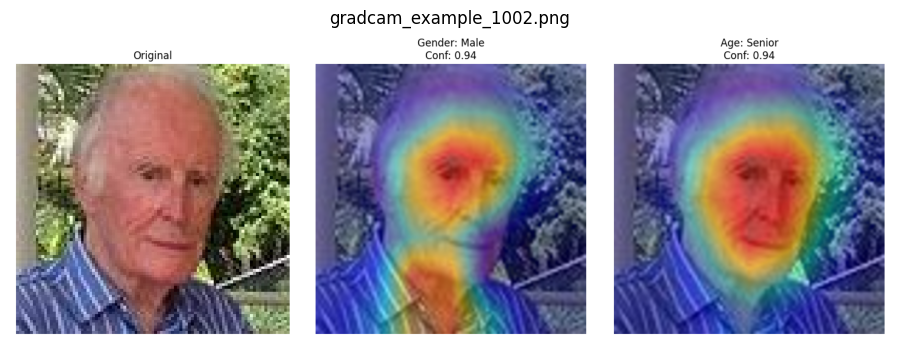

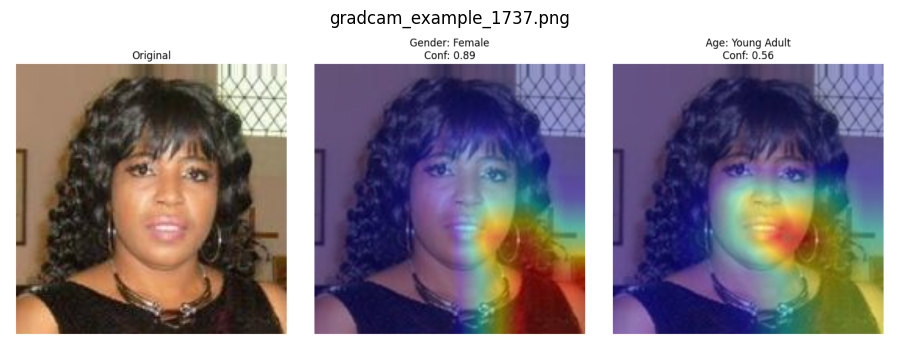

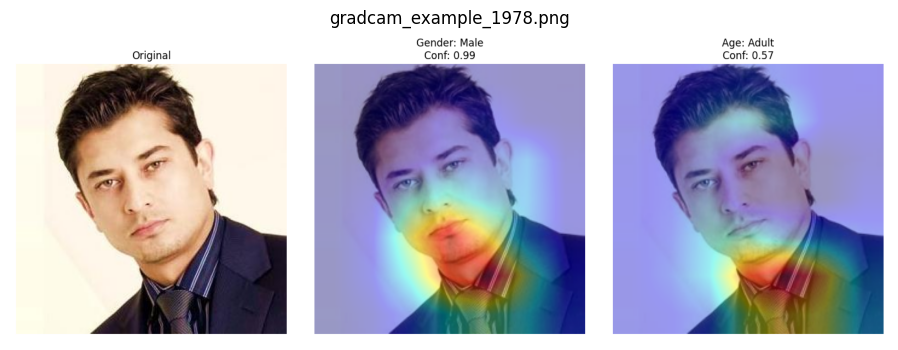

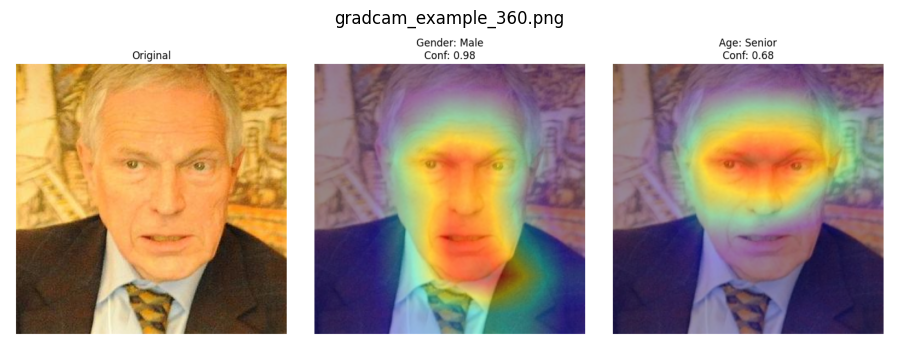

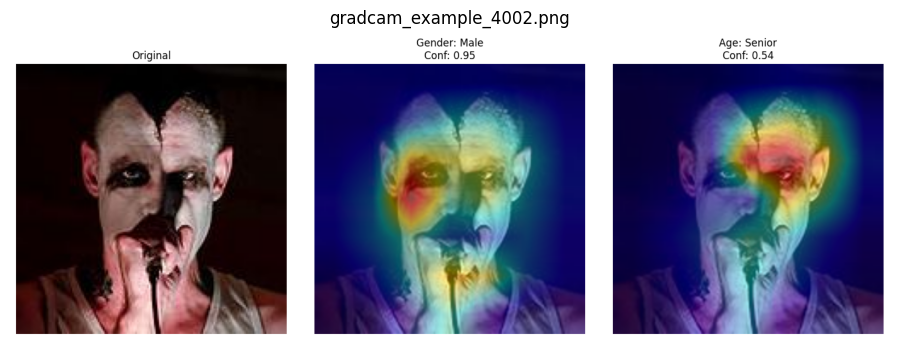

In [136]:
saved_files = list(GRADCAM_DIR.glob("*.png"))

print("Saved Grad-CAM files:", len(saved_files))

for path in saved_files[:5]:
    image = Image.open(path).convert("RGB")

    plt.figure(figsize=(12, 4))
    plt.imshow(image)
    plt.title(path.name)
    plt.axis("off")
    plt.show()

# Grad-CAM Interpretation Notes

Grad-CAM helps inspect which image regions influenced the model prediction.

How to interpret the heatmap:

- warmer regions indicate stronger influence
- cooler regions indicate weaker influence
- if the heatmap focuses on facial regions, the model is likely using relevant features
- if the heatmap focuses on background, hair, clothes, or image borders, the prediction may be biased or unreliable

Important limitation:

Grad-CAM does not prove that the model is correct. It only gives a visual explanation of where the model focused.

In this project, Grad-CAM is used for explainability and error analysis, not as proof of model fairness or correctness.

# Create Production Project Files

Now we move from notebook code to reusable Python files.

The notebook was used for:
- data cleaning
- training
- evaluation
- Grad-CAM testing

Now we create actual project files for the web demo.

The final Streamlit app will use these files:

- `model/model_loader.py` loads the trained model
- `src/preprocessing.py` handles image preprocessing
- `src/predict.py` handles prediction logic
- `src/gradcam.py` handles Grad-CAM explainability
- `app.py` runs the Streamlit web app

In [137]:
# Make sure required folders exist

MODEL_DIR.mkdir(exist_ok=True)
SRC_DIR = PROJECT_ROOT / "src"
SRC_DIR.mkdir(exist_ok=True)

print("Model directory:", MODEL_DIR)
print("Source directory:", SRC_DIR)

Model directory: d:\Deep Learning\Dataset\face_dataset\model
Source directory: d:\Deep Learning\Dataset\face_dataset\src


# Image Preprocessing Module

This file contains the image preprocessing used during inference.

The Streamlit app must preprocess uploaded images in the same way as validation images during training.

We use:
- resize to 224x224
- tensor conversion
- ImageNet normalization

We do not use random augmentation during inference.

In [144]:
file_path = SRC_DIR / "preprocessing.py"

file_path.write_text(""""
from torchvision import transforms


IMAGE_SIZE = 224


def get_inference_transform():

    return transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])
""", encoding="utf-8")


331

# Create Model Loader

This file contains the model architecture and checkpoint loading logic.

The Streamlit app will use this file to load the trained multi-task ResNet34 model.

In [145]:
model_loader_code = r'''
import torch
import torch.nn as nn
from torchvision import models
from pathlib import Path


class MultiTaskResNet34(nn.Module):
    def __init__(self, num_gender_classes=2, num_age_classes=4, pretrained=False):
        super(MultiTaskResNet34, self).__init__()

        weights = models.ResNet34_Weights.DEFAULT if pretrained else None

        self.backbone = models.resnet34(weights=weights)

        num_features = self.backbone.fc.in_features

        self.backbone.fc = nn.Identity()

        self.gender_head = nn.Sequential(
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_gender_classes)
        )

        self.age_head = nn.Sequential(
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_age_classes)
        )

    def forward(self, x):
        features = self.backbone(x)

        gender_logits = self.gender_head(features)
        age_logits = self.age_head(features)

        return gender_logits, age_logits


def load_model(model_path, device):
    """
    Loads the trained multi-task ResNet34 model.
    """
    model_path = Path(model_path)

    if not model_path.exists():
        raise FileNotFoundError(f"Model file not found: {model_path}")

    checkpoint = torch.load(model_path, map_location=device)

    num_gender_classes = checkpoint.get("num_gender_classes", 2)
    num_age_classes = checkpoint.get("num_age_classes", 4)

    model = MultiTaskResNet34(
        num_gender_classes=num_gender_classes,
        num_age_classes=num_age_classes,
        pretrained=False
    )

    model.load_state_dict(checkpoint["model_state_dict"])
    model = model.to(device)
    model.eval()

    gender_names = checkpoint.get("gender_names", {
        0: "Female",
        1: "Male"
    })

    age_group_names = checkpoint.get("age_group_names", {
        0: "Child",
        1: "Young Adult",
        2: "Adult",
        3: "Senior"
    })

    return model, gender_names, age_group_names
'''

file_path = MODEL_DIR / "model_loader.py"
file_path.write_text(model_loader_code, encoding="utf-8")

print("Created:", file_path)

Created: d:\Deep Learning\Dataset\face_dataset\model\model_loader.py


# Create Prediction Module

This file contains the reusable prediction function used by the Streamlit app.

In [146]:
predict_code = r'''
import torch


def predict_image(image, model, transform, device, gender_names, age_group_names):
    """
    Predicts gender and age group for one PIL image.
    """
    model.eval()

    image = image.convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        gender_outputs, age_outputs = model(input_tensor)

        gender_probs = torch.softmax(gender_outputs, dim=1)
        age_probs = torch.softmax(age_outputs, dim=1)

        gender_confidence, gender_prediction = torch.max(gender_probs, dim=1)
        age_confidence, age_prediction = torch.max(age_probs, dim=1)

    gender_idx = int(gender_prediction.item())
    age_idx = int(age_prediction.item())

    result = {
        "predicted_gender": gender_names[gender_idx],
        "gender_confidence": float(gender_confidence.item()),
        "predicted_age_group": age_group_names[age_idx],
        "age_confidence": float(age_confidence.item())
    }

    return result
'''

file_path = SRC_DIR / "predict.py"
file_path.write_text(predict_code, encoding="utf-8")

print("Created:", file_path)

Created: d:\Deep Learning\Dataset\face_dataset\src\predict.py


# Create Grad-CAM Module

This file contains Grad-CAM logic for explainability.

In [147]:
gradcam_code = r'''
import numpy as np
import cv2
import torch
import torch.nn.functional as F


IMAGE_SIZE = 224


class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        self.forward_hook = self.target_layer.register_forward_hook(self.save_activations)
        self.backward_hook = self.target_layer.register_full_backward_hook(self.save_gradients)

    def save_activations(self, module, input, output):
        self.activations = output

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate_cam(self, input_tensor, task="gender", target_class=None):
        self.model.eval()
        self.model.zero_grad()

        gender_output, age_output = self.model(input_tensor)

        if task == "gender":
            output = gender_output
        elif task == "age":
            output = age_output
        else:
            raise ValueError("task must be either 'gender' or 'age'")

        if target_class is None:
            target_class = output.argmax(dim=1).item()

        target_score = output[:, target_class]
        target_score.backward(retain_graph=True)

        gradients = self.gradients
        activations = self.activations

        weights = gradients.mean(dim=(2, 3), keepdim=True)

        cam = (weights * activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = F.interpolate(
            cam,
            size=(IMAGE_SIZE, IMAGE_SIZE),
            mode="bilinear",
            align_corners=False
        )

        cam = cam.squeeze().detach().cpu().numpy()

        cam_min = cam.min()
        cam_max = cam.max()

        if cam_max - cam_min != 0:
            cam = (cam - cam_min) / (cam_max - cam_min)
        else:
            cam = np.zeros_like(cam)

        return cam, target_class

    def remove_hooks(self):
        self.forward_hook.remove()
        self.backward_hook.remove()


def overlay_heatmap_on_image(original_image, heatmap, alpha=0.4):
    """
    Overlays Grad-CAM heatmap on the original image.
    """
    original_image = original_image.convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
    original_np = np.array(original_image)

    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_np, 1 - alpha, heatmap_color, alpha, 0)

    return overlay


def generate_gradcam(image, model, transform, device):
    """
    Generates gender and age Grad-CAM overlays for one PIL image.
    """
    image = image.convert("RGB")

    input_tensor = transform(image).unsqueeze(0).to(device)

    target_layer = model.backbone.layer4[-1]
    gradcam = GradCAM(model, target_layer)

    gender_cam, gender_target_class = gradcam.generate_cam(
        input_tensor=input_tensor,
        task="gender"
    )

    age_cam, age_target_class = gradcam.generate_cam(
        input_tensor=input_tensor,
        task="age"
    )

    gradcam.remove_hooks()

    gender_overlay = overlay_heatmap_on_image(image, gender_cam)
    age_overlay = overlay_heatmap_on_image(image, age_cam)

    return gender_overlay, age_overlay
'''

file_path = SRC_DIR / "gradcam.py"
file_path.write_text(gradcam_code, encoding="utf-8")

print("Created:", file_path)

Created: d:\Deep Learning\Dataset\face_dataset\src\gradcam.py


# Create Streamlit App

This creates the main web demo file.

Run it later from the project root using:

`streamlit run app.py`

In [148]:
app_code = r'''
import streamlit as st
import torch
from PIL import Image
from pathlib import Path

from model.model_loader import load_model
from src.preprocessing import get_inference_transform
from src.predict import predict_image
from src.gradcam import generate_gradcam


st.set_page_config(
    page_title="Age & Gender Prediction Demo",
    page_icon="🧠",
    layout="wide"
)


PROJECT_ROOT = Path(__file__).resolve().parent
MODEL_PATH = PROJECT_ROOT / "model" / "multitask_resnet34.pth"


@st.cache_resource
def load_cached_model():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model, gender_names, age_group_names = load_model(MODEL_PATH, device)
    transform = get_inference_transform()

    return model, gender_names, age_group_names, transform, device


def format_confidence(confidence):
    return f"{confidence * 100:.2f}%"


st.title("Explainable Age and Gender Prediction")

st.write(
    "Upload a face image to predict gender and age group using a multi-task ResNet34 model. "
    "Grad-CAM heatmaps show which regions influenced the model's prediction."
)

model, gender_names, age_group_names, transform, device = load_cached_model()

st.sidebar.header("Model Information")
st.sidebar.write("Architecture: Multi-task ResNet34")
st.sidebar.write("Framework: PyTorch")
st.sidebar.write("Explainability: Grad-CAM")
st.sidebar.write(f"Device: {device}")

uploaded_file = st.file_uploader(
    "Upload a face image",
    type=["jpg", "jpeg", "png"]
)

if uploaded_file is not None:
    image = Image.open(uploaded_file).convert("RGB")

    st.subheader("Uploaded Image")
    st.image(image, width=350)

    if st.button("Run Prediction"):
        with st.spinner("Running prediction..."):
            result = predict_image(
                image=image,
                model=model,
                transform=transform,
                device=device,
                gender_names=gender_names,
                age_group_names=age_group_names
            )

        st.subheader("Prediction Results")

        col1, col2 = st.columns(2)

        with col1:
            st.metric(
                label="Predicted Gender",
                value=result["predicted_gender"],
                delta=format_confidence(result["gender_confidence"])
            )

        with col2:
            st.metric(
                label="Predicted Age Group",
                value=result["predicted_age_group"],
                delta=format_confidence(result["age_confidence"])
            )

        st.subheader("Grad-CAM Explainability")

        with st.spinner("Generating Grad-CAM heatmaps..."):
            gender_overlay, age_overlay = generate_gradcam(
                image=image,
                model=model,
                transform=transform,
                device=device
            )

        cam_col1, cam_col2 = st.columns(2)

        with cam_col1:
            st.image(
                gender_overlay,
                caption="Gender Grad-CAM Heatmap",
                use_container_width=True
            )

        with cam_col2:
            st.image(
                age_overlay,
                caption="Age Group Grad-CAM Heatmap",
                use_container_width=True
            )

        st.info(
            "Grad-CAM highlights the image regions that influenced the model prediction. "
            "It does not prove correctness; it helps inspect model attention."
        )

else:
    st.warning("Upload an image to start prediction.")
'''

file_path = PROJECT_ROOT / "app.py"
file_path.write_text(app_code, encoding="utf-8")

print("Created:", file_path)

Created: d:\Deep Learning\Dataset\face_dataset\app.py


# Requirements File

This file lists dependencies required to run the project.

In [149]:
requirements_code = r'''
torch
torchvision
pandas
numpy
matplotlib
scikit-learn
pillow
opencv-python
streamlit
tqdm
'''

file_path = PROJECT_ROOT / "requirements.txt"
file_path.write_text(requirements_code.strip(), encoding="utf-8")

print("Created:", file_path)

Created: d:\Deep Learning\Dataset\face_dataset\requirements.txt


# Verify Created Files

Now we verify that all required production files were created successfully.

In [150]:
required_files = [
    PROJECT_ROOT / "app.py",
    SRC_DIR / "preprocessing.py",
    SRC_DIR / "predict.py",
    SRC_DIR / "gradcam.py",
    MODEL_DIR / "model_loader.py",
    PROJECT_ROOT / "requirements.txt",
    MODEL_DIR / "multitask_resnet34.pth"
]

for file in required_files:
    print(file.exists(), "->", file)

True -> d:\Deep Learning\Dataset\face_dataset\app.py
True -> d:\Deep Learning\Dataset\face_dataset\src\preprocessing.py
True -> d:\Deep Learning\Dataset\face_dataset\src\predict.py
True -> d:\Deep Learning\Dataset\face_dataset\src\gradcam.py
True -> d:\Deep Learning\Dataset\face_dataset\model\model_loader.py
True -> d:\Deep Learning\Dataset\face_dataset\requirements.txt
True -> d:\Deep Learning\Dataset\face_dataset\model\multitask_resnet34.pth
